# SegNet Segmentation




In [1]:
# import modules (download with pip install first if not on local. Type on terminal: pip install <module name>)
import torch
import torch.nn as nn
import torch.nn.functional as F #contains some useful functions like activation functions & convolution operations you can use
import numpy as np
import os

# install torchvision first

device = torch.device("cuda: 0" if torch.cuda.is_available() else "cpu")
print("Using",device,"...")

Using cpu ...


## Dataset

In [2]:
from load_data import *
# X, y = load_data('/content/drive/My Drive/AIWIRE', 'dataset')
# X, y = load_data('.', 'small_dataset')
X, y = load_data('.', '../data/iteration_1_dataset')

In [3]:
import dataset

from imgaug import augmenters as iaa 
from sklearn.model_selection import train_test_split
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

batch_size = 50
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
dataloaders = dataset.gen_dataloaders(X_train, X_test, y_train, y_test, batch_size)

# Initialize augmentation types 
seq = iaa.Sequential([
    iaa.Sometimes(0.7,
                  iaa.Fliplr(0.5)),
    iaa.Sometimes(0.4,
        iaa.Affine(
        scale = {"x": (0.8,1.2), "y": (0.8,1.2)},
        rotate = (-5,5)
        )
    )
])

# Function that applies augmentation to batch during training
def apply_augmentation(image,mask):
    
    ims_aug=torch.zeros([len(image),1,image.shape[2],image.shape[3]],dtype=torch.float64)
    mask_aug=torch.zeros([len(mask),mask.shape[1],mask.shape[2]],dtype=torch.float64)
    
    for i in range(len(image)): 
        segmap = np.squeeze(mask[i].numpy())
        segmap = SegmentationMapsOnImage(segmap,shape=image.shape)
        im,gt = seq(images=np.squeeze(image[i].numpy()),segmentation_maps=segmap)
        gt = gt.get_arr().astype(float)
        im,gt = torch.from_numpy(im),torch.from_numpy(gt)
        ims_aug[i,0] = im
        mask_aug[i] = gt
        
    return ims_aug, mask_aug 

{'train': 1600, 'val': 400}


In [4]:
from scipy.ndimage import gaussian_filter

def norm(im):
    im -= im.min()
    im = im / im.max()
    return im

def weighted_BCE(weights=None):
    def weighted_binary_cross_entropy(output, target):
        if weights is not None:
            assert len(weights) == 2

            loss = weights[1] * (target * torch.log(output)) + \
                   weights[0] * ((1 - target) * torch.log(1 - output))
        else:
            loss = target * torch.log(output) + (1 - target) * torch.log(1 - output)

        return torch.neg(torch.mean(loss))
    return weighted_binary_cross_entropy

torch.Size([128, 64])
torch.Size([8192, 1])
Showing images
torch.Size([1, 128, 64]) torch.Size([1, 128, 64])
Class balance (one sigma): 2.392578125%
Loss for null model: 0.07289190404117107


C:\Users\noonp\Anaconda3\envs\python3.6\lib\site-packages\imgaug\imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)


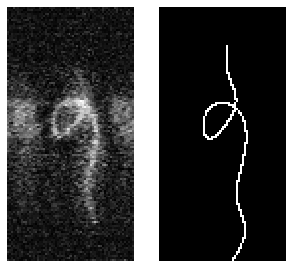

torch.Size([1, 128, 64]) torch.Size([1, 128, 64])
Class balance (one sigma): 2.392578125%
Loss for null model: 0.07289190404117107


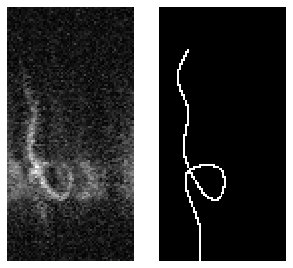

torch.Size([1, 128, 64]) torch.Size([1, 128, 64])
Class balance (one sigma): 1.98974609375%
Loss for null model: 0.06338074534772886


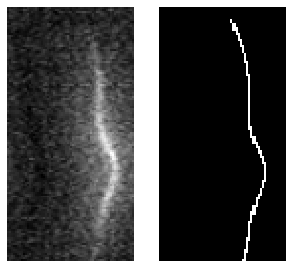

In [5]:
import matplotlib.pyplot as plt

# loss_function = nn.MSELoss()
class_weighting_multiplier = 3/4
loss_function = weighted_BCE(weights = torch.Tensor([1 - class_weighting_multiplier, class_weighting_multiplier]))
# loss_function = weighted_BCE(weights = torch.Tensor([0, 1]))
def show(im):
    plt.imshow(im, cmap='gray')
    plt.axis('off')

    
print(dataloaders['train'])
n = 3
first_batch = next(iter(dataloaders['train']))

ims = first_batch[0][:n]
gts = first_batch[1][:n].float()
# gts = first_batch[1][:n].numpy()

print(gts[0].shape)
print(gts[0].reshape(-1,1).shape)
# h2 = plt.hist(gts[0].reshape(-1,1), bins = 40, density = True, alpha=1)
# plt.show()
# h2 = plt.hist(ims[0].numpy().reshape(-1,1), bins = 40, density = True, alpha=1)
# plt.show()

print('Showing images')
for [im], gt in zip(ims, gts):
    segmap = gt.numpy()
    segmap = SegmentationMapsOnImage(segmap,shape=im.shape)
    im,gt = seq(images=im.numpy(),segmentation_maps=segmap)
    gt = gt.get_arr().astype(float)
    im,gt = torch.from_numpy(im),torch.from_numpy(gt)
    plt.figure(figsize=[5]*2)
    plt.subplot(121)
    show(im)

    plt.subplot(122)
    show(gt)
#     one_hot_gt = one_hot_encode(gt)
#     print(one_hot_gt.shape)
    print(torch.Tensor(np.ones(gt.shape) * np.average(gt)).unsqueeze(0).shape, gt.unsqueeze(0).shape)
    base_loss = loss_function(torch.Tensor(np.ones(gt.shape) * np.average(gt)).unsqueeze(0), gt.unsqueeze(0))
    print(f'Class balance (one sigma): {100 * torch.sum((gt - np.std(gt.numpy())) > 0).item() / np.prod(gt.shape)}%')
    print('Loss for null model:', base_loss.item())
    
    plt.show()

## Model

In [6]:
# Get a batch of training data
inputs, masks = next(iter(dataloaders['train']))

print(inputs.shape, masks.shape)
print(inputs.dtype, masks.dtype)

for x in [inputs.numpy(), masks.numpy()]:
    print(x.min(), x.max(), x.mean(), x.std())

# install torchsummary first
from torchsummary import summary
# import model from python file
import Segnet
import importlib
importlib.reload(Segnet)

num_class = 1
model = Segnet.SegNet(num_class)
model = model.to(device)
print(model.type)
print("MODEL ARCHITECTURE ...")
summary(model, input_size=(1,128,64))

save_path = 'saved_models/model_thin.pth'

torch.Size([50, 1, 128, 64]) torch.Size([50, 128, 64])
torch.float64 torch.float64
0.00034398783611385857 1.0 0.20971368172201843 0.14135850255074184
0.0 1.0 0.02025634765625 0.14087593135762808
<bound method Module.type of SegNet(
  (model): Sequential(
    (0): Conv2d(1, 4, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(4, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): Conv2d(32, 64, kerne

## Training

In [7]:
from torch.utils.tensorboard import SummaryWriter
import datetime
writer = SummaryWriter('./logs/{0}',format(datetime.datetime.now().strftime('%Y-%m-%d,%H:%M:%S')))
import matplotlib.gridspec as gridspec


import matplotlib.pyplot as plt
def visualise(outputs, title, n=7):
    fig = plt.figure(figsize=[10, 3])
    fig.suptitle(title, fontsize=14)
    for i, output in enumerate(outputs[:n]):
        plt.subplot(1,n,i+1)
        plt.axis('off')
        plt.imshow(output) if output.shape[0] == 3 else plt.imshow(output, cmap='gray')
    plt.show()

Epoch 0/99
----------
LR 0.005


C:\Users\noonp\Anaconda3\envs\python3.6\lib\site-packages\imgaug\imgaug.py:106: DeprecationWarning: Got a float array as the segmentation map in SegmentationMapsOnImage. That is deprecated. Please provide instead a (H,W,[C]) array of dtype bool_, int or uint, where C denotes the segmentation map index.
  warn(msg, category=DeprecationWarning, stacklevel=stacklevel)


Batch 0 : 0.20350666344165802
Batch 10 : 0.17501504719257355
Batch 20 : 0.14825530350208282
Batch 30 : 0.10607943683862686
Loss train : 0.15649766
Batch 0 : 0.120767742395401
Loss val : 0.12158118


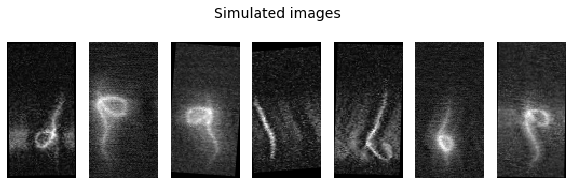

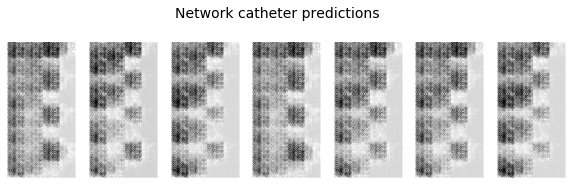

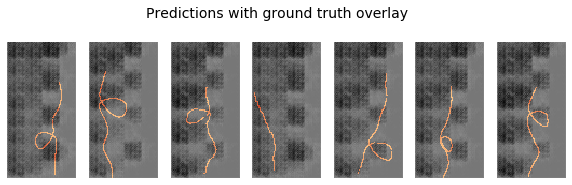

saving best model
0m 19s
Epoch 1/99
----------
LR 0.005
Batch 0 : 0.09817977249622345
Batch 10 : 0.06479069590568542
Batch 20 : 0.05364732816815376
Batch 30 : 0.0492800772190094
Loss train : 0.06279127
Batch 0 : 0.05183324217796326
Loss val : 0.04974714


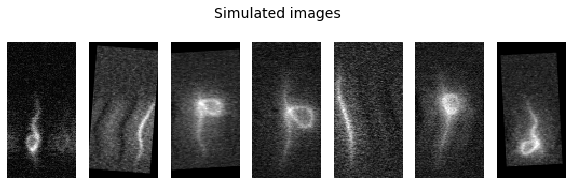

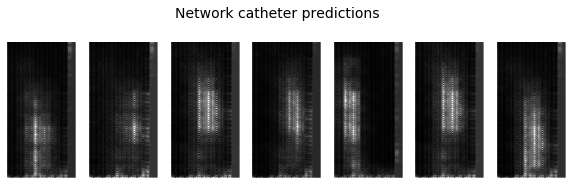

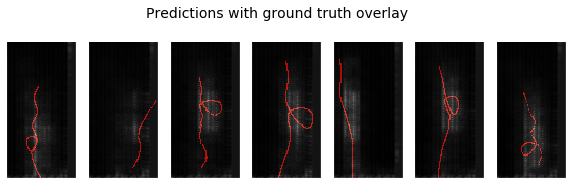

saving best model
0m 21s
Epoch 2/99
----------
LR 0.005
Batch 0 : 0.04762467369437218
Batch 10 : 0.044957246631383896
Batch 20 : 0.044525910168886185
Batch 30 : 0.04413282498717308
Loss train : 0.04530776
Batch 0 : 0.044221412390470505
Loss val : 0.04376786


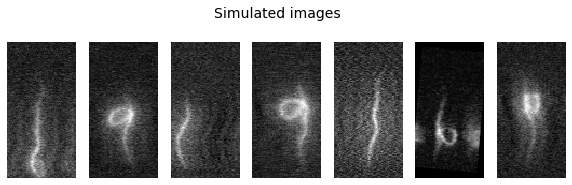

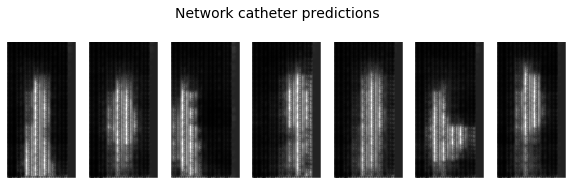

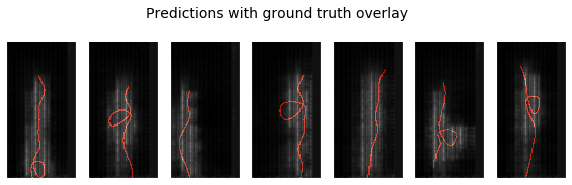

saving best model
0m 26s
Epoch 3/99
----------
LR 0.005
Batch 0 : 0.042788248509168625
Batch 10 : 0.04412350803613663
Batch 20 : 0.041586149483919144
Batch 30 : 0.03987349197268486
Loss train : 0.04136837
Batch 0 : 0.04111913591623306
Loss val : 0.04078799


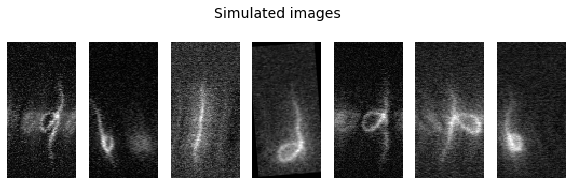

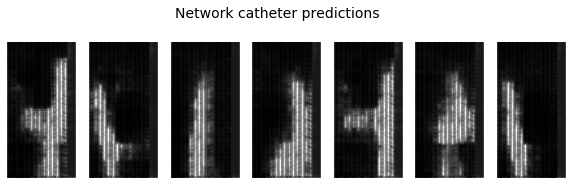

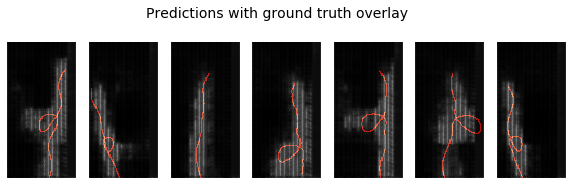

saving best model
0m 31s
Epoch 4/99
----------
LR 0.005
Batch 0 : 0.039859604090452194
Batch 10 : 0.03973210230469704
Batch 20 : 0.03699696436524391
Batch 30 : 0.03635208308696747
Loss train : 0.03801223
Batch 0 : 0.036879200488328934
Loss val : 0.03685319


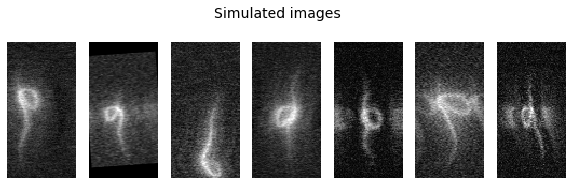

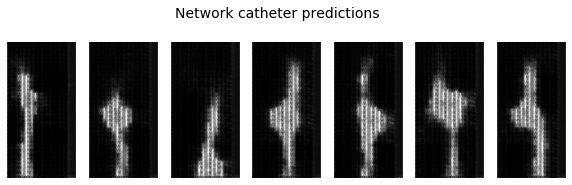

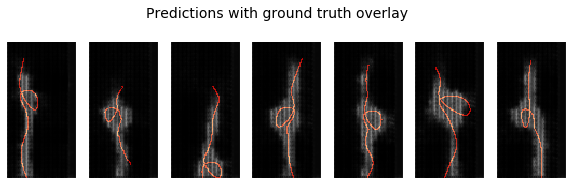

saving best model
0m 26s
Epoch 5/99
----------
LR 0.005
Batch 0 : 0.036775145679712296
Batch 10 : 0.03623240441083908
Batch 20 : 0.03485095500946045
Batch 30 : 0.033442042768001556
Loss train : 0.03533125
Batch 0 : 0.03590118885040283
Loss val : 0.03403213


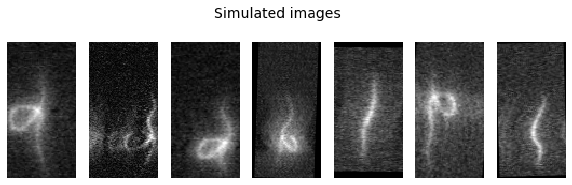

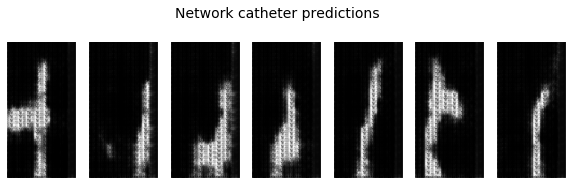

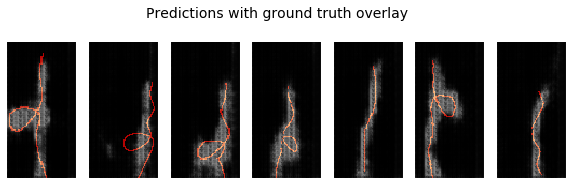

saving best model
0m 24s
Epoch 6/99
----------
LR 0.005
Batch 0 : 0.03329779952764511
Batch 10 : 0.03195231780409813
Batch 20 : 0.03210877254605293
Batch 30 : 0.03242935985326767
Loss train : 0.03283208
Batch 0 : 0.03299610689282417
Loss val : 0.03210294


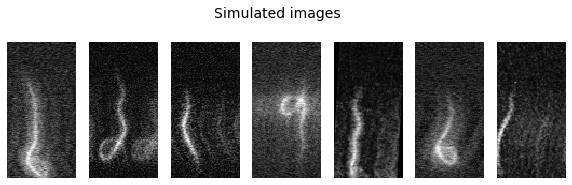

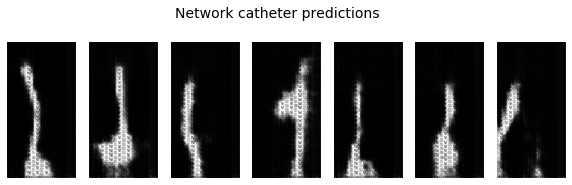

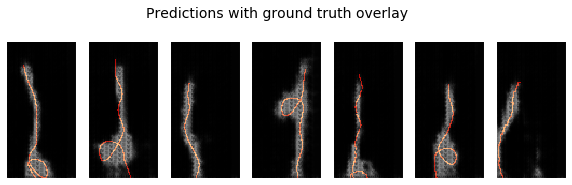

saving best model
0m 24s
Epoch 7/99
----------
LR 0.005
Batch 0 : 0.03167535364627838
Batch 10 : 0.030037779361009598
Batch 20 : 0.030575472861528397
Batch 30 : 0.030921312049031258
Loss train : 0.03155126
Batch 0 : 0.03280637785792351
Loss val : 0.03122150


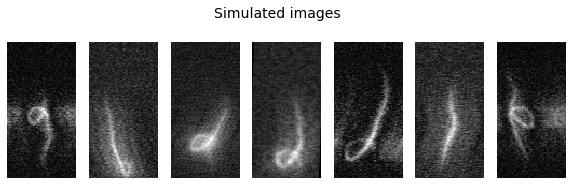

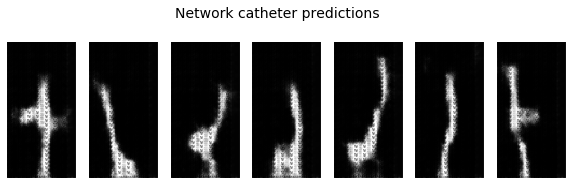

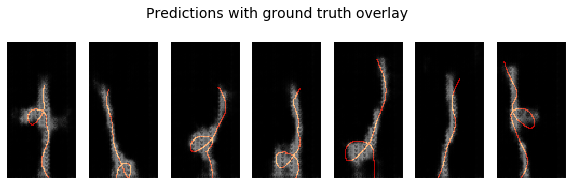

saving best model
0m 25s
Epoch 8/99
----------
LR 0.005
Batch 0 : 0.03180467337369919
Batch 10 : 0.03067486733198166
Batch 20 : 0.03046632744371891
Batch 30 : 0.029938044026494026
Loss train : 0.03048475
Batch 0 : 0.030718550086021423
Loss val : 0.03059828


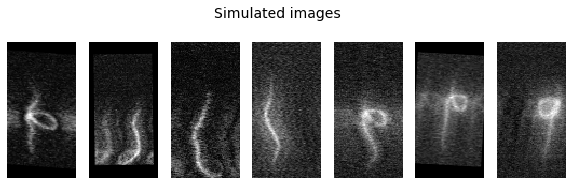

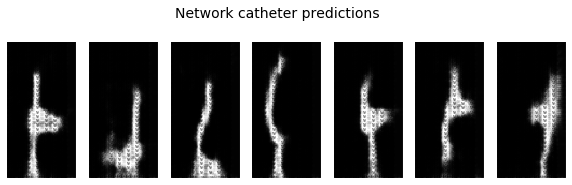

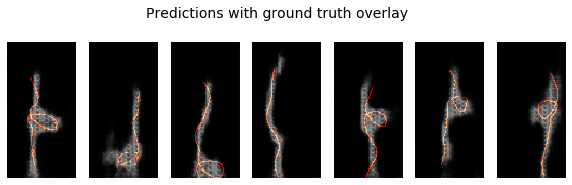

saving best model
0m 24s
Epoch 9/99
----------
LR 0.005
Batch 0 : 0.03110944665968418
Batch 10 : 0.030027007684111595
Batch 20 : 0.030303029343485832
Batch 30 : 0.02922002226114273
Loss train : 0.02986946
Batch 0 : 0.030659310519695282
Loss val : 0.03017752


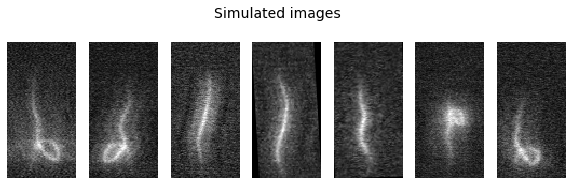

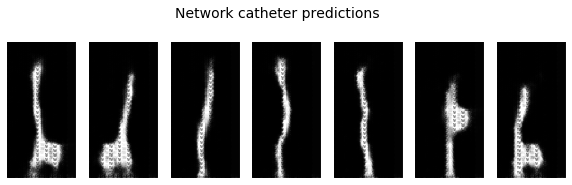

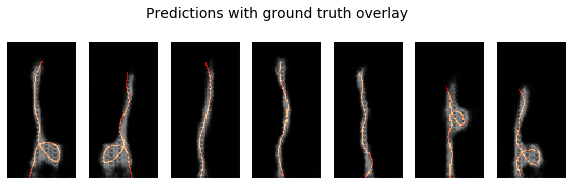

saving best model
0m 24s
Epoch 10/99
----------
LR 0.005
Batch 0 : 0.02905537560582161
Batch 10 : 0.02847844548523426
Batch 20 : 0.028309550136327744
Batch 30 : 0.028078988194465637
Loss train : 0.02892368
Batch 0 : 0.029237236827611923
Loss val : 0.02850754


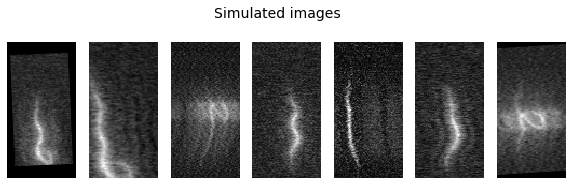

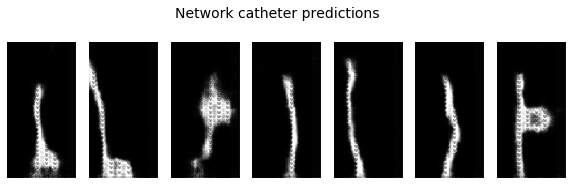

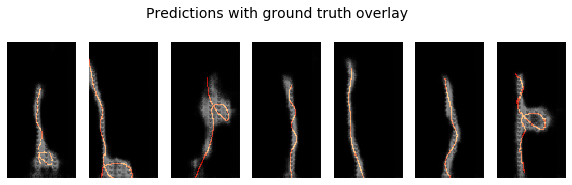

saving best model
0m 24s
Epoch 11/99
----------
LR 0.005
Batch 0 : 0.029113607481122017
Batch 10 : 0.02849280834197998
Batch 20 : 0.029956044629216194
Batch 30 : 0.029366379603743553
Loss train : 0.02843212
Batch 0 : 0.02768600732088089
Loss val : 0.02829963


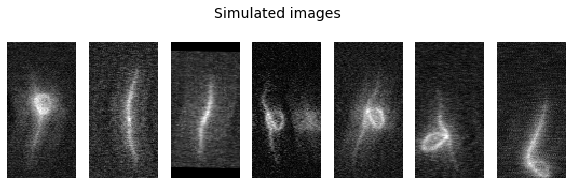

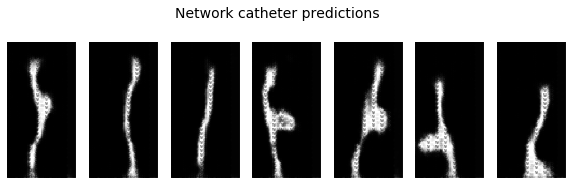

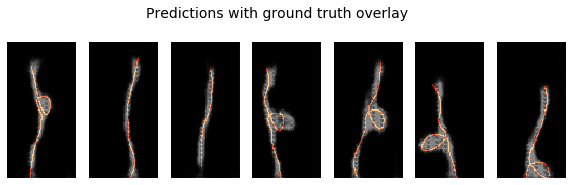

saving best model
0m 24s
Epoch 12/99
----------
LR 0.005
Batch 0 : 0.028691178187727928
Batch 10 : 0.027450967580080032
Batch 20 : 0.026903750374913216
Batch 30 : 0.028099287301301956
Loss train : 0.02790506
Batch 0 : 0.02733735553920269
Loss val : 0.02792067


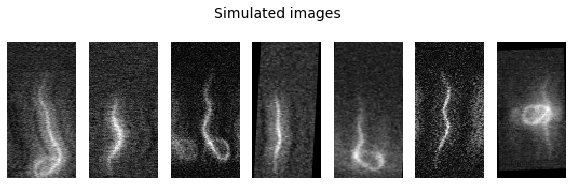

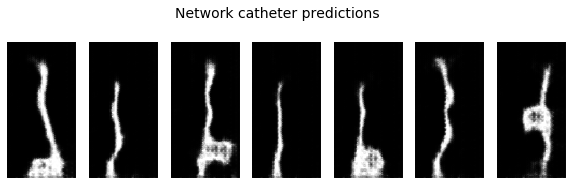

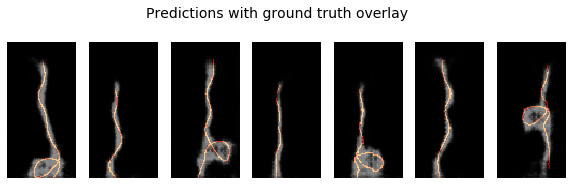

saving best model
0m 26s
Epoch 13/99
----------
LR 0.005
Batch 0 : 0.027419378980994225
Batch 10 : 0.02776459977030754
Batch 20 : 0.029637658968567848
Batch 30 : 0.027637090533971786
Loss train : 0.02726327
Batch 0 : 0.02662225440144539
Loss val : 0.02719511


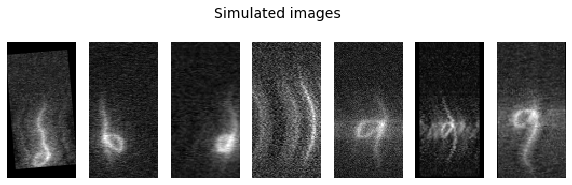

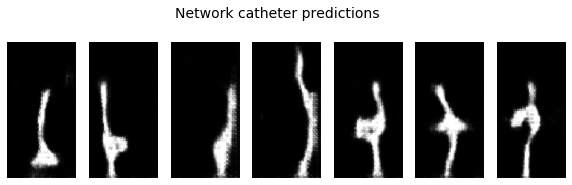

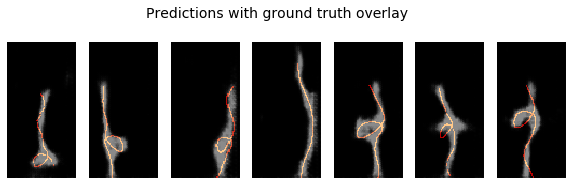

saving best model
0m 24s
Epoch 14/99
----------
LR 0.005
Batch 0 : 0.02611722983419895
Batch 10 : 0.025997409597039223
Batch 20 : 0.026280658319592476
Batch 30 : 0.027555270120501518
Loss train : 0.02688965
Batch 0 : 0.026166997849941254
Loss val : 0.02696626


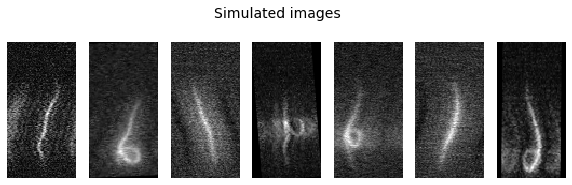

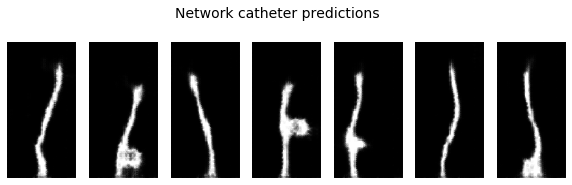

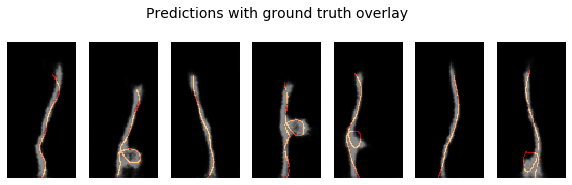

saving best model
0m 24s
Epoch 15/99
----------
LR 0.005
Batch 0 : 0.024985400959849358
Batch 10 : 0.02572619915008545
Batch 20 : 0.026183752343058586
Batch 30 : 0.02892846055328846
Loss train : 0.02653761
Batch 0 : 0.026520611718297005
Loss val : 0.02655317


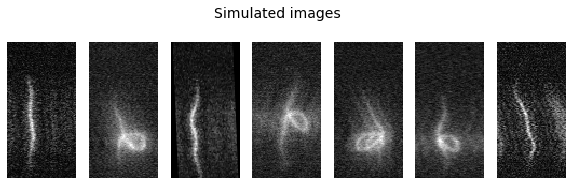

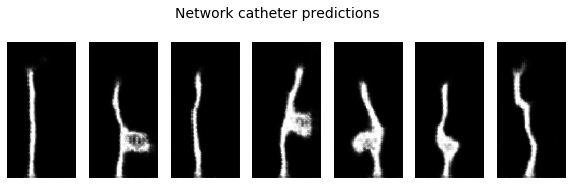

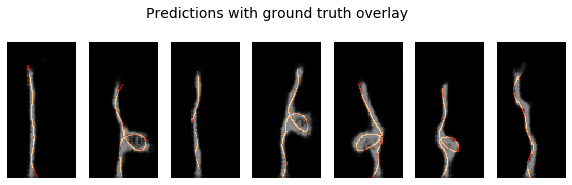

saving best model
0m 26s
Epoch 16/99
----------
LR 0.005
Batch 0 : 0.025745853781700134
Batch 10 : 0.02673533745110035
Batch 20 : 0.026293756440281868
Batch 30 : 0.026641247794032097
Loss train : 0.02606860
Batch 0 : 0.026662493124604225
Loss val : 0.02631161


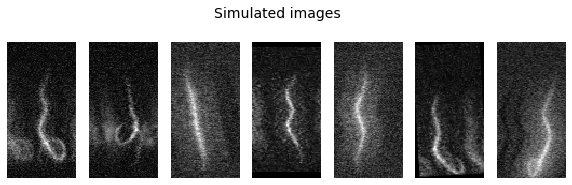

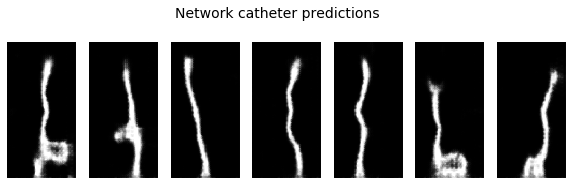

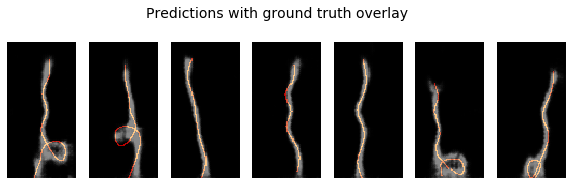

saving best model
0m 28s
Epoch 17/99
----------
LR 0.005
Batch 0 : 0.025044945999979973
Batch 10 : 0.02518625184893608
Batch 20 : 0.028195569291710854
Batch 30 : 0.024940215051174164
Loss train : 0.02610691
Batch 0 : 0.026253754273056984
Loss val : 0.02625040


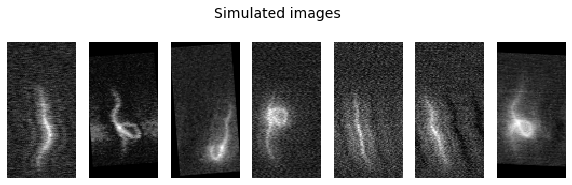

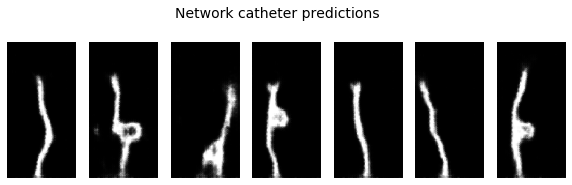

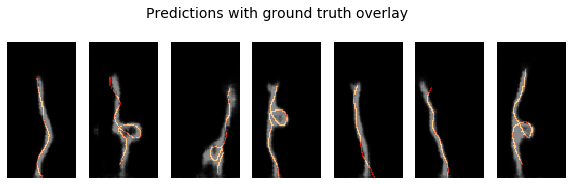

saving best model
0m 31s
Epoch 18/99
----------
LR 0.005
Batch 0 : 0.025788282975554466
Batch 10 : 0.0246557779610157
Batch 20 : 0.02483278512954712
Batch 30 : 0.025518955662846565
Loss train : 0.02554822
Batch 0 : 0.025542177259922028
Loss val : 0.02643982


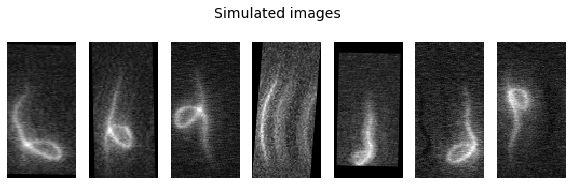

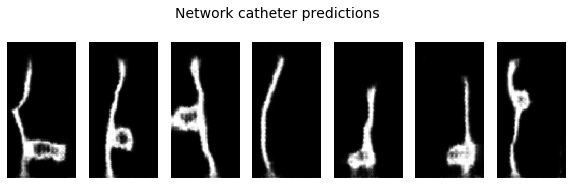

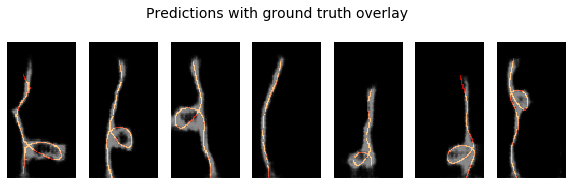

0m 24s
Epoch 19/99
----------
LR 0.005
Batch 0 : 0.026302777230739594
Batch 10 : 0.02586715668439865
Batch 20 : 0.025906942784786224
Batch 30 : 0.026221852749586105
Loss train : 0.02539080
Batch 0 : 0.0258360393345356
Loss val : 0.02552101


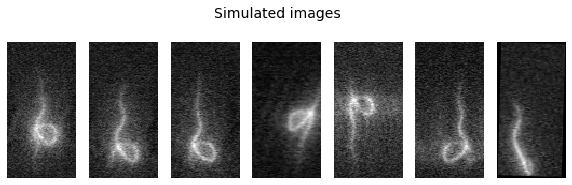

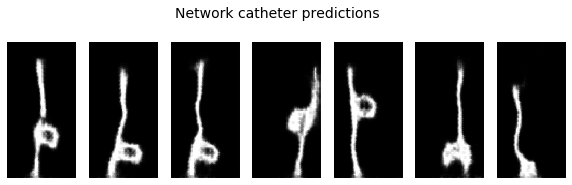

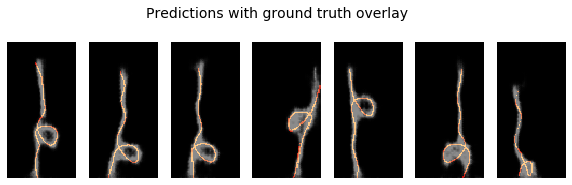

saving best model
0m 24s
Epoch 20/99
----------
LR 0.005
Batch 0 : 0.024410443380475044
Batch 10 : 0.02538365311920643
Batch 20 : 0.025770986452698708
Batch 30 : 0.02411116100847721
Loss train : 0.02532491
Batch 0 : 0.025995595380663872
Loss val : 0.02551574


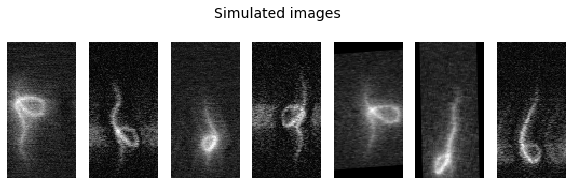

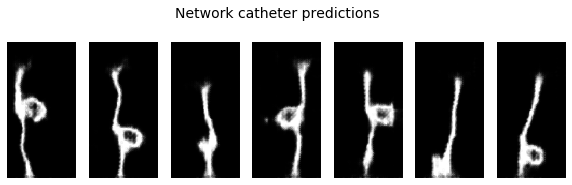

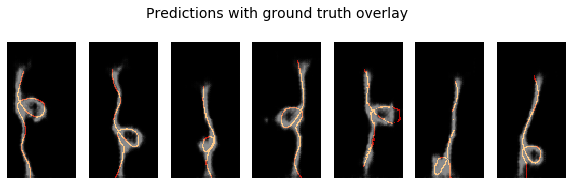

saving best model
0m 23s
Epoch 21/99
----------
LR 0.005
Batch 0 : 0.024522554129362106
Batch 10 : 0.026686856523156166
Batch 20 : 0.02457715943455696
Batch 30 : 0.025770502164959908
Loss train : 0.02508797
Batch 0 : 0.02571251429617405
Loss val : 0.02546260


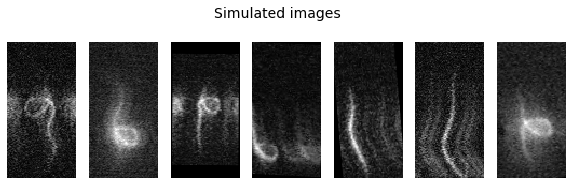

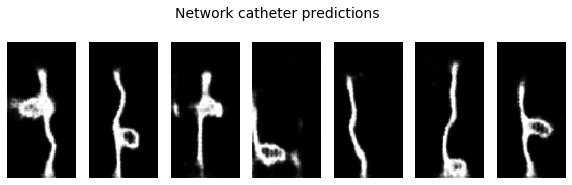

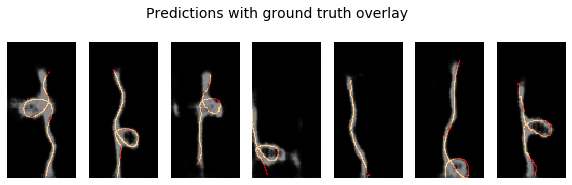

saving best model
0m 23s
Epoch 22/99
----------
LR 0.005
Batch 0 : 0.02395530231297016
Batch 10 : 0.02459833398461342
Batch 20 : 0.02501426264643669
Batch 30 : 0.02527453750371933
Loss train : 0.02489530
Batch 0 : 0.02685033343732357
Loss val : 0.02520680


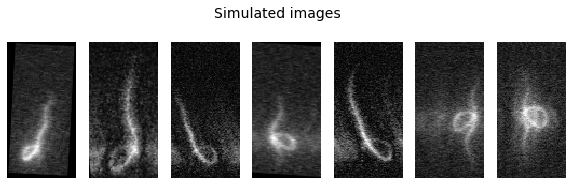

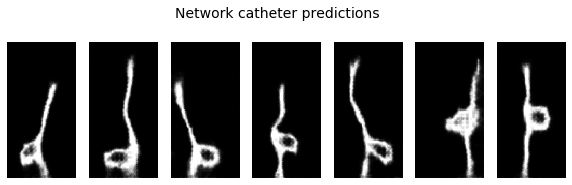

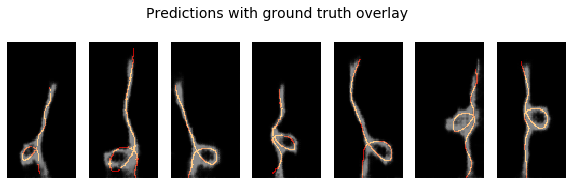

saving best model
0m 23s
Epoch 23/99
----------
LR 0.005
Batch 0 : 0.02437470108270645
Batch 10 : 0.022921981289982796
Batch 20 : 0.023673269897699356
Batch 30 : 0.02370270900428295
Loss train : 0.02438812
Batch 0 : 0.025644904002547264
Loss val : 0.02489796


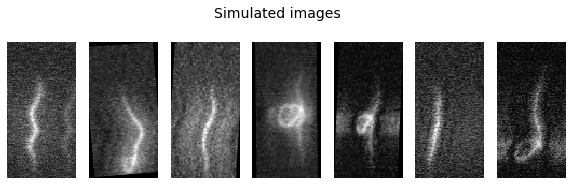

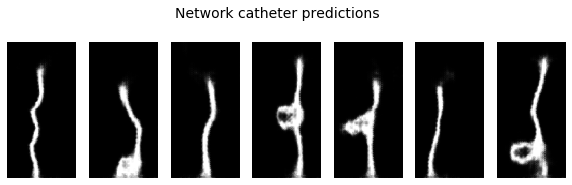

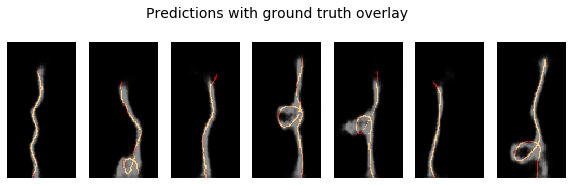

saving best model
0m 27s
Epoch 24/99
----------
LR 0.005
Batch 0 : 0.024819400161504745
Batch 10 : 0.02414470911026001
Batch 20 : 0.022629981860518456
Batch 30 : 0.024505460634827614
Loss train : 0.02431340
Batch 0 : 0.02392512746155262
Loss val : 0.02487390


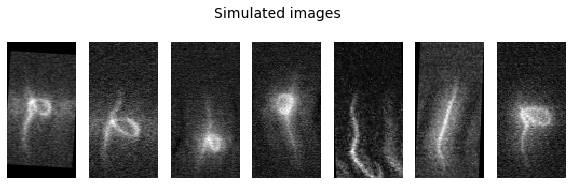

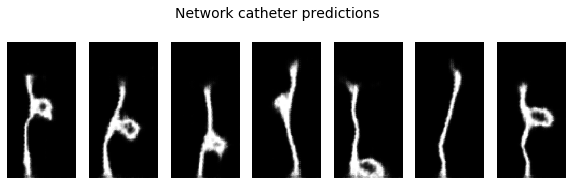

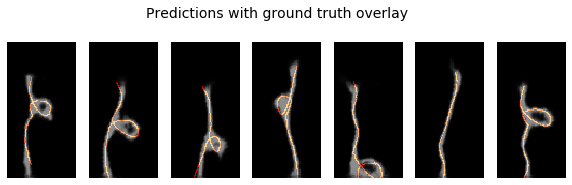

saving best model
0m 30s
Epoch 25/99
----------
LR 0.005
Batch 0 : 0.02507602982223034
Batch 10 : 0.02469503879547119
Batch 20 : 0.022522659972310066
Batch 30 : 0.024497460573911667
Loss train : 0.02427264
Batch 0 : 0.02321714349091053
Loss val : 0.02503887


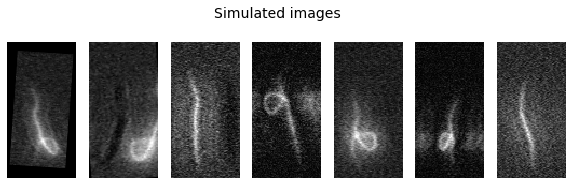

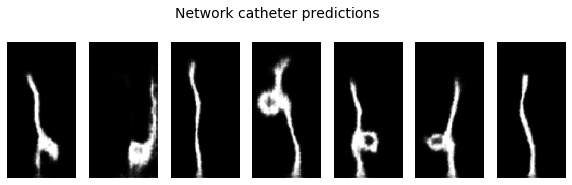

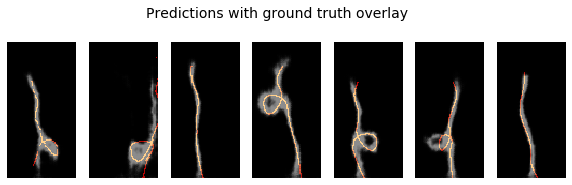

0m 30s
Epoch 26/99
----------
LR 0.005
Batch 0 : 0.025706591084599495
Batch 10 : 0.023657098412513733
Batch 20 : 0.025337697938084602
Batch 30 : 0.02441675215959549
Loss train : 0.02413521
Batch 0 : 0.02421191707253456
Loss val : 0.02492904


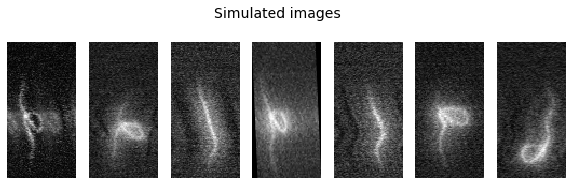

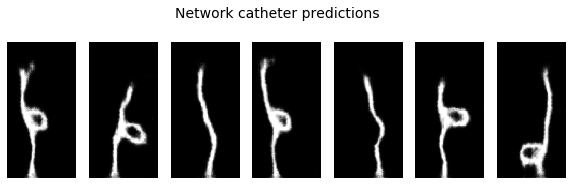

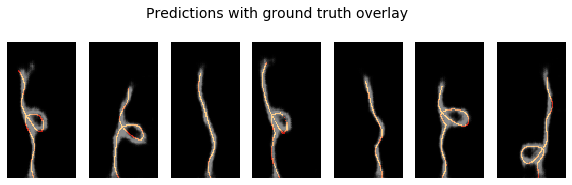

0m 30s
Epoch 27/99
----------
LR 0.005
Batch 0 : 0.025384528562426567
Batch 10 : 0.02480502612888813
Batch 20 : 0.025118598714470863
Batch 30 : 0.024587251245975494
Loss train : 0.02420597
Batch 0 : 0.025499112904071808
Loss val : 0.02443792


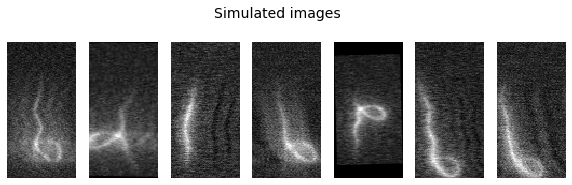

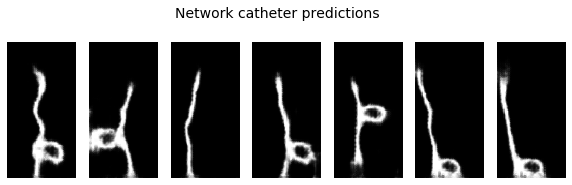

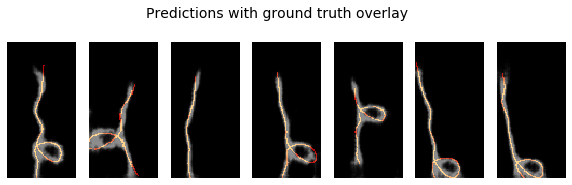

saving best model
0m 29s
Epoch 28/99
----------
LR 0.005
Batch 0 : 0.023518970236182213
Batch 10 : 0.021556921303272247
Batch 20 : 0.023364661261439323
Batch 30 : 0.024969328194856644
Loss train : 0.02389147
Batch 0 : 0.024128669872879982
Loss val : 0.02432599


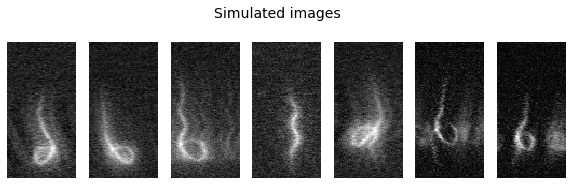

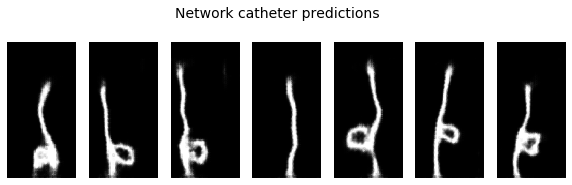

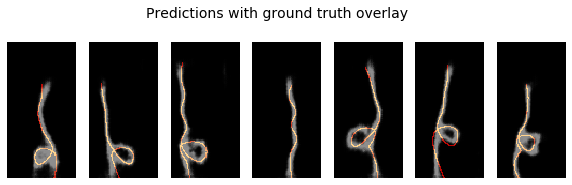

saving best model
0m 28s
Epoch 29/99
----------
LR 0.005
Batch 0 : 0.024065228179097176
Batch 10 : 0.02359590120613575
Batch 20 : 0.023287685588002205
Batch 30 : 0.022799722850322723
Loss train : 0.02363653
Batch 0 : 0.024277644231915474
Loss val : 0.02420223


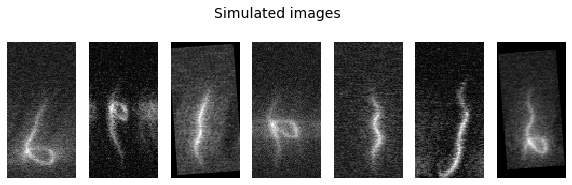

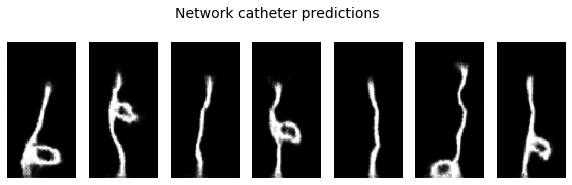

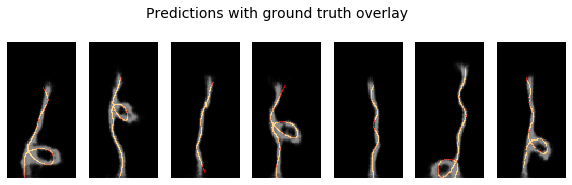

saving best model
0m 28s
Epoch 30/99
----------
LR 0.005
Batch 0 : 0.022755032405257225
Batch 10 : 0.024122944101691246
Batch 20 : 0.023722605779767036
Batch 30 : 0.023984432220458984
Loss train : 0.02351138
Batch 0 : 0.024588119238615036
Loss val : 0.02448559


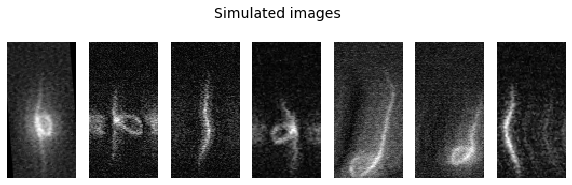

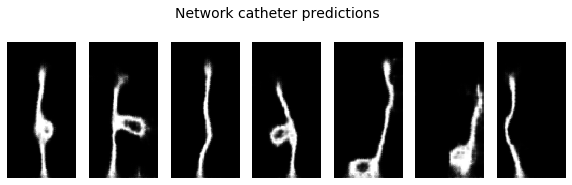

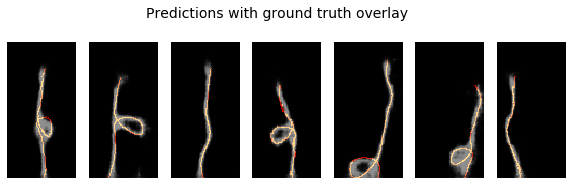

0m 31s
Epoch 31/99
----------
LR 0.005
Batch 0 : 0.024089422076940536
Batch 10 : 0.023669224232435226
Batch 20 : 0.023158833384513855
Batch 30 : 0.021885929629206657
Loss train : 0.02331788
Batch 0 : 0.026918459683656693
Loss val : 0.02424738


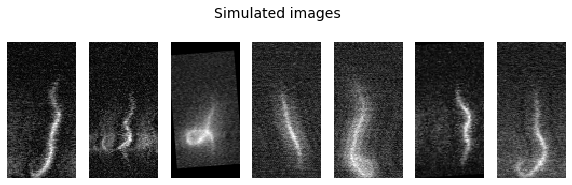

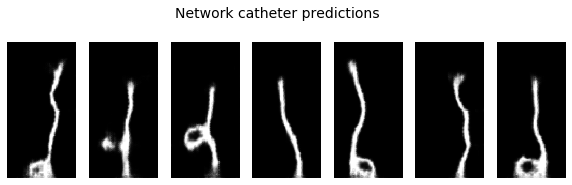

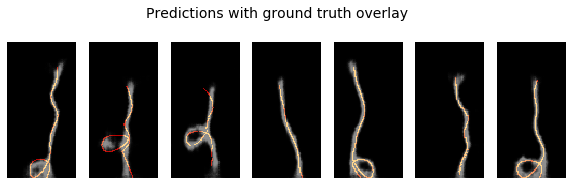

0m 28s
Epoch 32/99
----------
LR 0.005
Batch 0 : 0.02320101670920849
Batch 10 : 0.02447161264717579
Batch 20 : 0.022456396371126175
Batch 30 : 0.023147286847233772
Loss train : 0.02334015
Batch 0 : 0.02331283502280712
Loss val : 0.02405185


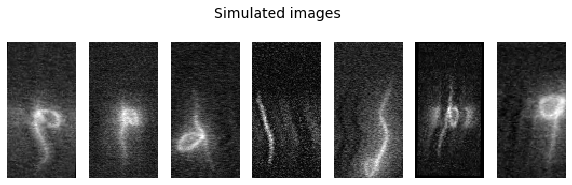

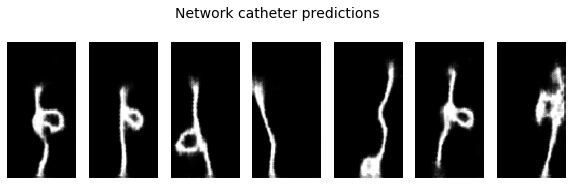

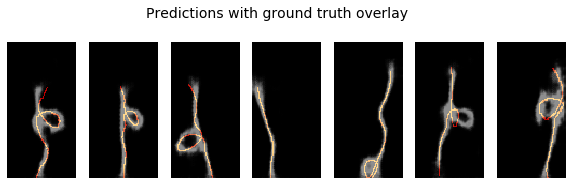

saving best model
0m 27s
Epoch 33/99
----------
LR 0.005
Batch 0 : 0.022505294531583786
Batch 10 : 0.02244887314736843
Batch 20 : 0.02297133207321167
Batch 30 : 0.02291092462837696
Loss train : 0.02318390
Batch 0 : 0.02396850660443306
Loss val : 0.02384050


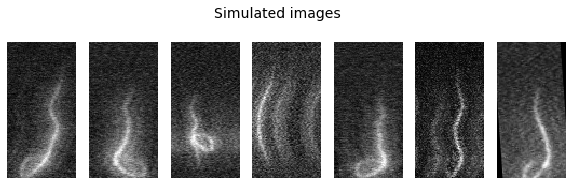

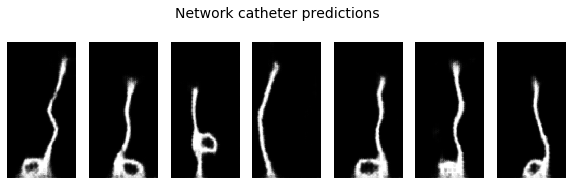

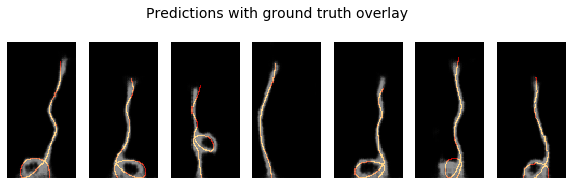

saving best model
0m 27s
Epoch 34/99
----------
LR 0.005
Batch 0 : 0.02229798585176468
Batch 10 : 0.022288918495178223
Batch 20 : 0.02290346659719944
Batch 30 : 0.022355051711201668
Loss train : 0.02315202
Batch 0 : 0.02507522515952587
Loss val : 0.02386725


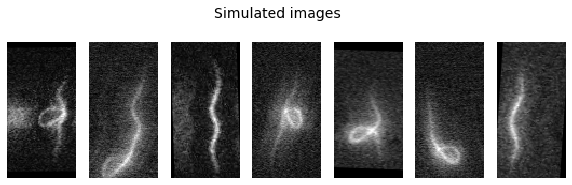

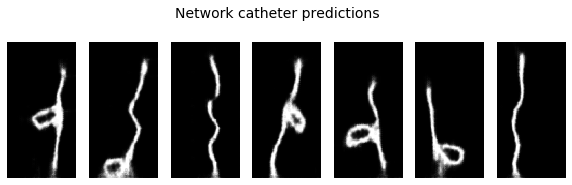

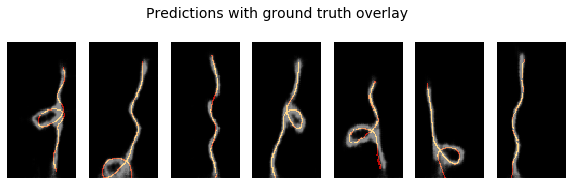

0m 28s
Epoch 35/99
----------
LR 0.005
Batch 0 : 0.023998422548174858
Batch 10 : 0.022440103814005852
Batch 20 : 0.023985762149095535
Batch 30 : 0.0225568488240242
Loss train : 0.02303273
Batch 0 : 0.023174671456217766
Loss val : 0.02330690


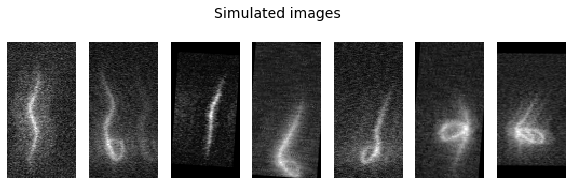

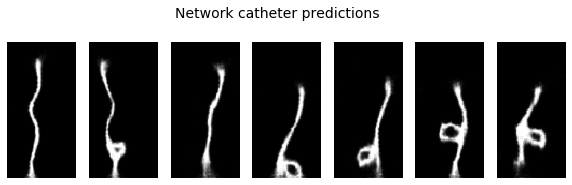

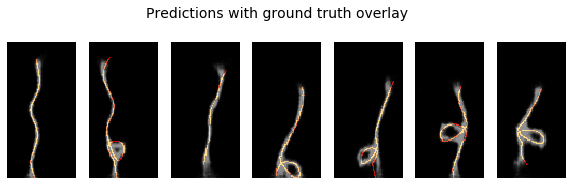

saving best model
0m 31s
Epoch 36/99
----------
LR 0.005
Batch 0 : 0.023050401359796524
Batch 10 : 0.022224869579076767
Batch 20 : 0.02351655252277851
Batch 30 : 0.02233751490712166
Loss train : 0.02273045
Batch 0 : 0.02357589639723301
Loss val : 0.02365054


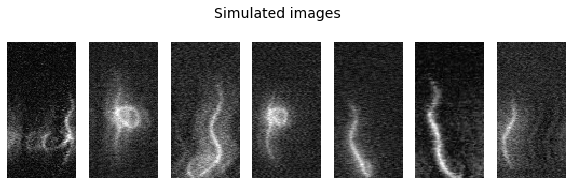

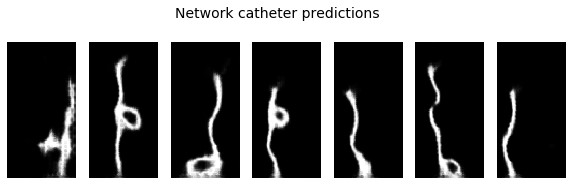

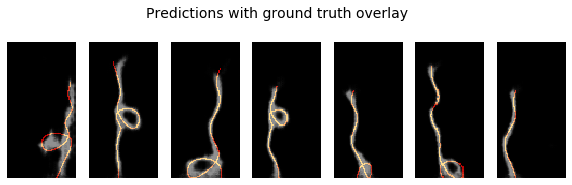

0m 28s
Epoch 37/99
----------
LR 0.005
Batch 0 : 0.02375049516558647
Batch 10 : 0.02386222407221794
Batch 20 : 0.023909160867333412
Batch 30 : 0.02281128615140915
Loss train : 0.02264023
Batch 0 : 0.023224852979183197
Loss val : 0.02313188


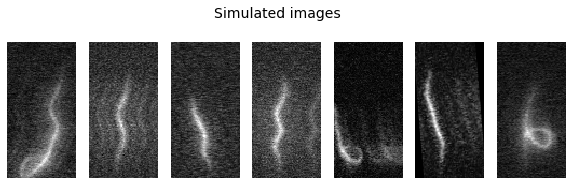

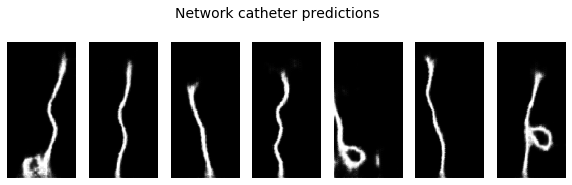

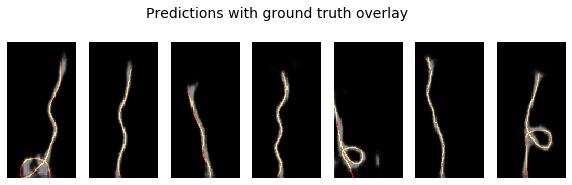

saving best model
0m 28s
Epoch 38/99
----------
LR 0.005
Batch 0 : 0.021342601627111435
Batch 10 : 0.02269982174038887
Batch 20 : 0.022582760080695152
Batch 30 : 0.022601885721087456
Loss train : 0.02243598
Batch 0 : 0.022687077522277832
Loss val : 0.02355996


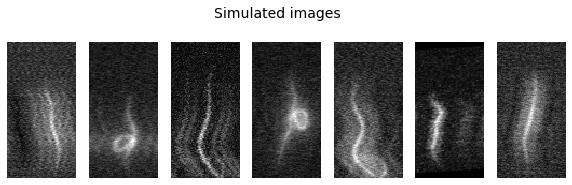

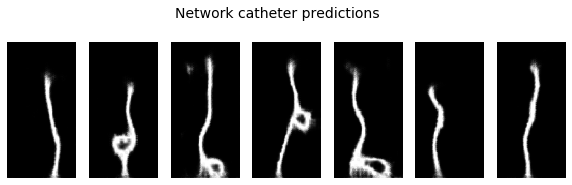

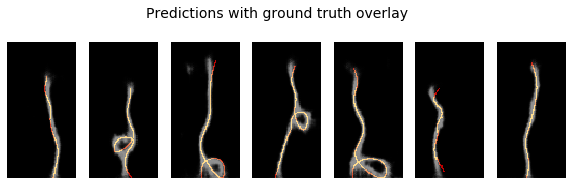

0m 29s
Epoch 39/99
----------
LR 0.005
Batch 0 : 0.02147611603140831
Batch 10 : 0.022738713771104813
Batch 20 : 0.02145196869969368
Batch 30 : 0.023509936407208443
Loss train : 0.02231142
Batch 0 : 0.022920385003089905
Loss val : 0.02290209


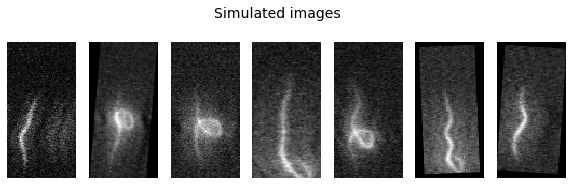

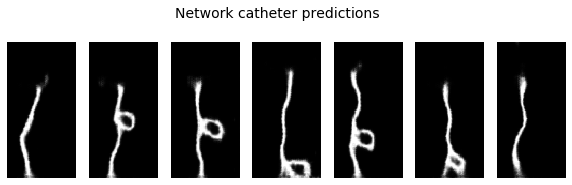

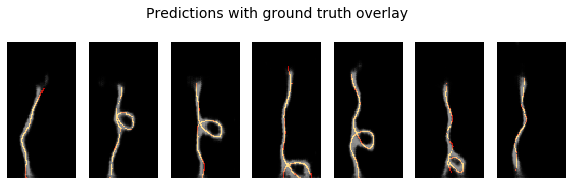

saving best model
0m 33s
Epoch 40/99
----------
LR 0.005
Batch 0 : 0.02234794571995735
Batch 10 : 0.022995056584477425
Batch 20 : 0.02224241942167282
Batch 30 : 0.021803952753543854
Loss train : 0.02235090
Batch 0 : 0.024034284055233
Loss val : 0.02341825


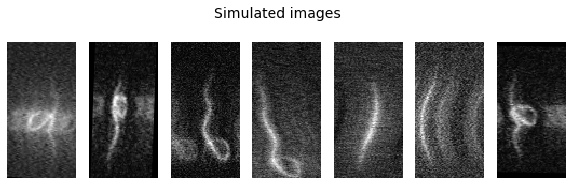

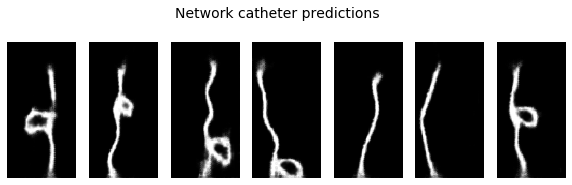

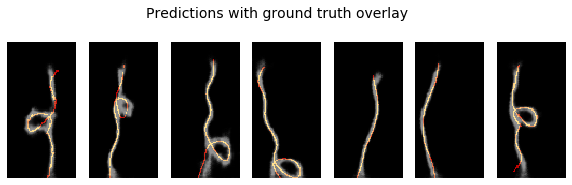

0m 28s
Epoch 41/99
----------
LR 0.005
Batch 0 : 0.021654628217220306
Batch 10 : 0.021253246814012527
Batch 20 : 0.021862445399165154
Batch 30 : 0.02210841327905655
Loss train : 0.02203822
Batch 0 : 0.022216377779841423
Loss val : 0.02281820


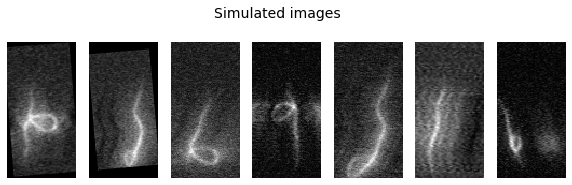

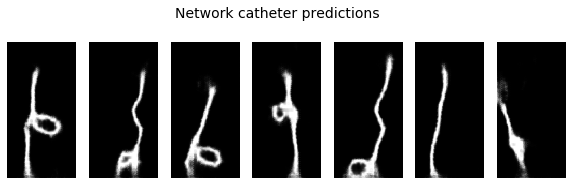

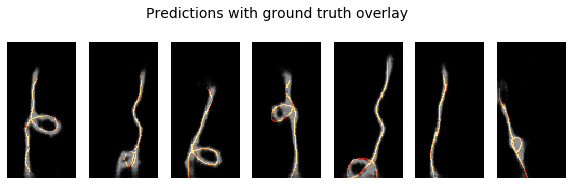

saving best model
0m 27s
Epoch 42/99
----------
LR 0.005
Batch 0 : 0.023822657763957977
Batch 10 : 0.023660138249397278
Batch 20 : 0.02230287529528141
Batch 30 : 0.022472001612186432
Loss train : 0.02213641
Batch 0 : 0.022182106971740723
Loss val : 0.02288136


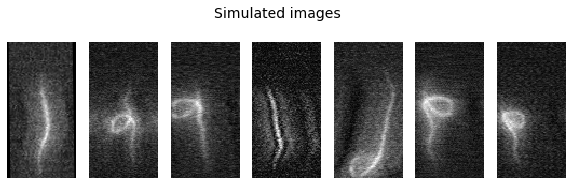

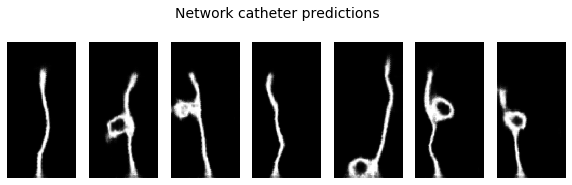

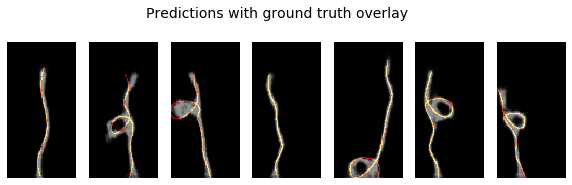

0m 31s
Epoch 43/99
----------
LR 0.005
Batch 0 : 0.02178274467587471
Batch 10 : 0.020754408091306686
Batch 20 : 0.0208436269313097
Batch 30 : 0.02178550325334072
Loss train : 0.02188822
Batch 0 : 0.022481251507997513
Loss val : 0.02336490


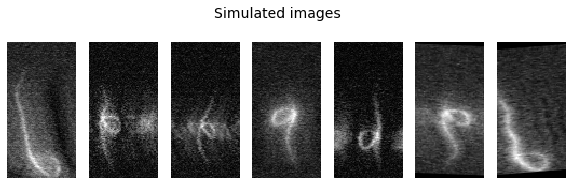

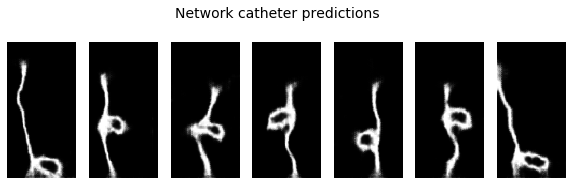

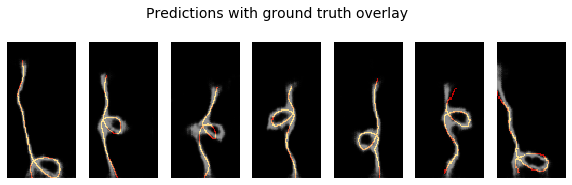

0m 35s
Epoch 44/99
----------
LR 0.005
Batch 0 : 0.021910130977630615
Batch 10 : 0.022332174703478813
Batch 20 : 0.021494185552001
Batch 30 : 0.020751791074872017
Loss train : 0.02197187
Batch 0 : 0.02354656159877777
Loss val : 0.02335860


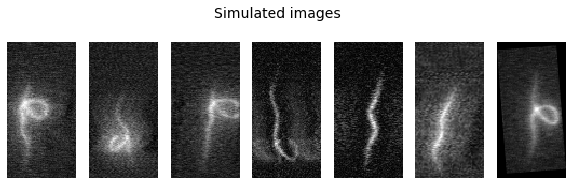

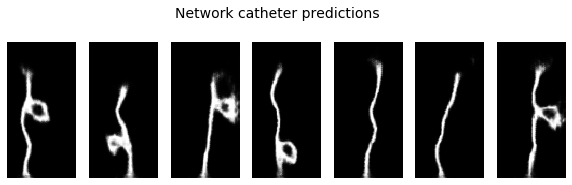

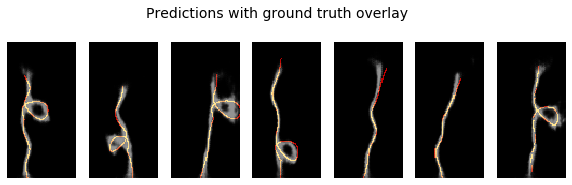

0m 28s
Epoch 45/99
----------
LR 0.005
Batch 0 : 0.022735755890607834
Batch 10 : 0.02253671921789646
Batch 20 : 0.023779334500432014
Batch 30 : 0.020985960960388184
Loss train : 0.02191597
Batch 0 : 0.02402138151228428
Loss val : 0.02295618


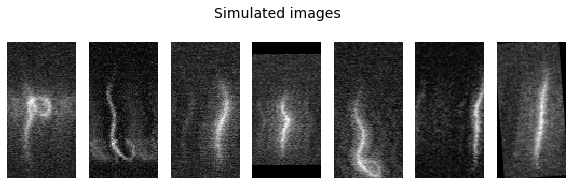

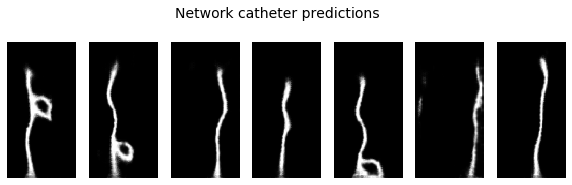

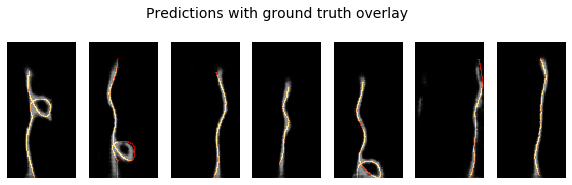

0m 27s
Epoch 46/99
----------
LR 0.005
Batch 0 : 0.021836629137396812
Batch 10 : 0.022578546777367592
Batch 20 : 0.02099894918501377
Batch 30 : 0.02083517052233219
Loss train : 0.02159463
Batch 0 : 0.022355571389198303
Loss val : 0.02240815


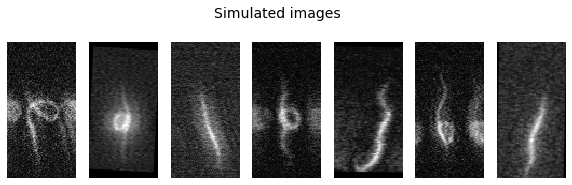

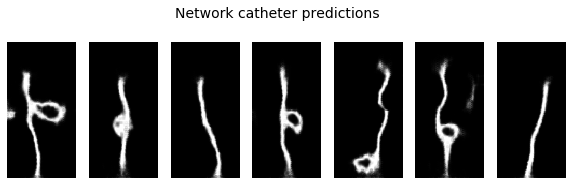

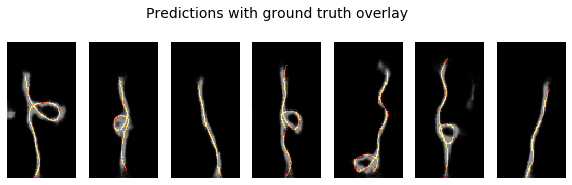

saving best model
0m 27s
Epoch 47/99
----------
LR 0.005
Batch 0 : 0.02110852301120758
Batch 10 : 0.021338215097784996
Batch 20 : 0.02161504700779915
Batch 30 : 0.02219468541443348
Loss train : 0.02152332
Batch 0 : 0.021741261705756187
Loss val : 0.02214602


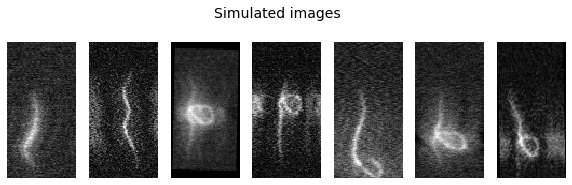

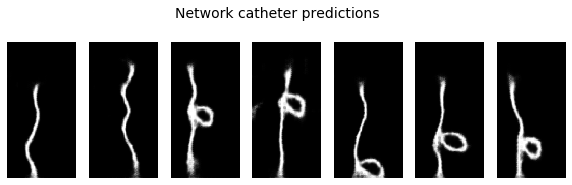

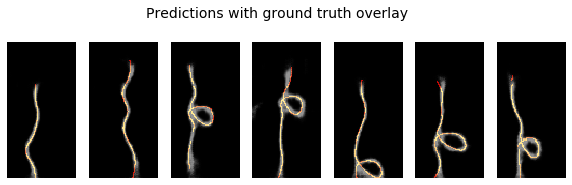

saving best model
0m 32s
Epoch 48/99
----------
LR 0.005
Batch 0 : 0.02012019231915474
Batch 10 : 0.022166436538100243
Batch 20 : 0.022259514778852463
Batch 30 : 0.021343350410461426
Loss train : 0.02144008
Batch 0 : 0.02398630604147911
Loss val : 0.02245595


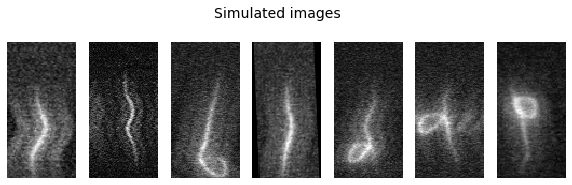

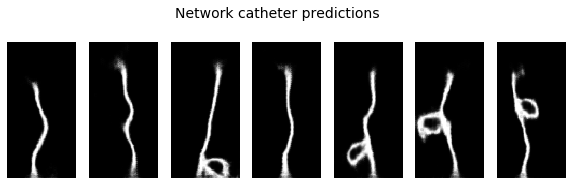

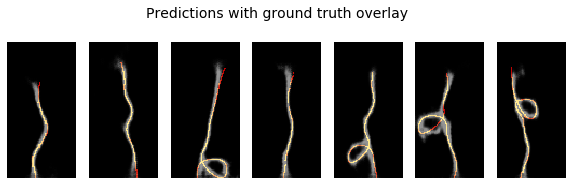

0m 30s
Epoch 49/99
----------
LR 0.005
Batch 0 : 0.02154778316617012
Batch 10 : 0.02051481045782566
Batch 20 : 0.021435914561152458
Batch 30 : 0.022429173812270164
Loss train : 0.02120025
Batch 0 : 0.022695695981383324
Loss val : 0.02230324


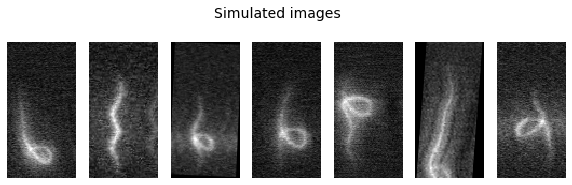

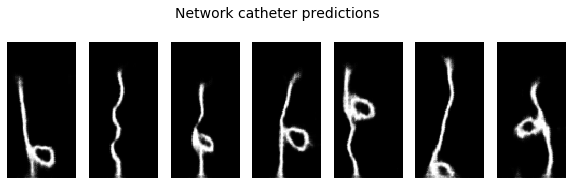

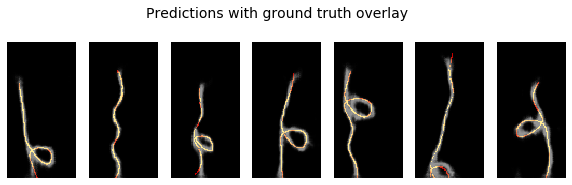

0m 29s
Epoch 50/99
----------
LR 0.005
Batch 0 : 0.022428104653954506
Batch 10 : 0.022421982139348984
Batch 20 : 0.020872430875897408
Batch 30 : 0.02079557627439499
Loss train : 0.02115444
Batch 0 : 0.02309507317841053
Loss val : 0.02290371


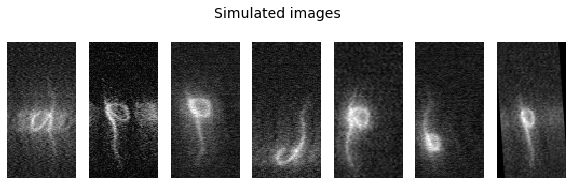

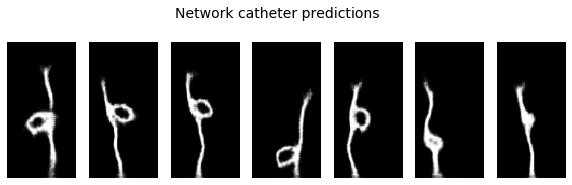

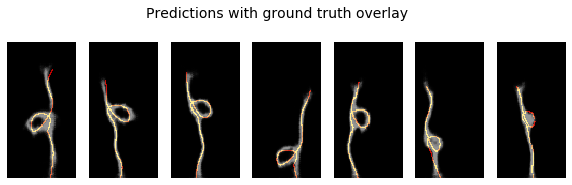

0m 27s
Epoch 51/99
----------
LR 0.005
Batch 0 : 0.020411847159266472
Batch 10 : 0.021271690726280212
Batch 20 : 0.020604483783245087
Batch 30 : 0.022098390385508537
Loss train : 0.02149736
Batch 0 : 0.022936975583434105
Loss val : 0.02236087


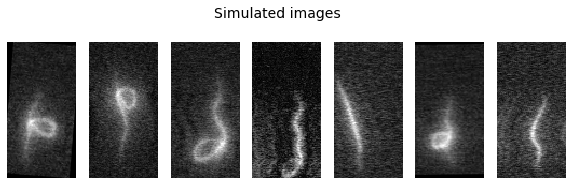

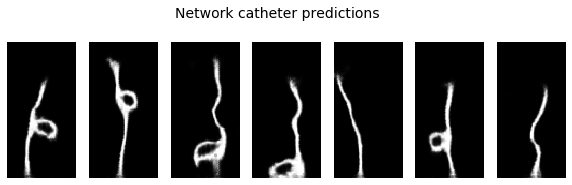

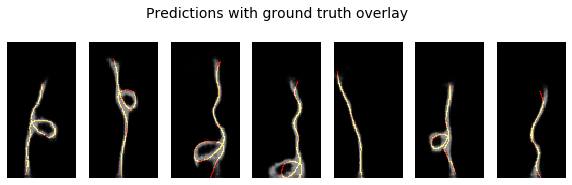

0m 30s
Epoch 52/99
----------
LR 0.005
Batch 0 : 0.022210706025362015
Batch 10 : 0.02006673812866211
Batch 20 : 0.022643061354756355
Batch 30 : 0.0210658460855484
Loss train : 0.02136612
Batch 0 : 0.022060472518205643
Loss val : 0.02234851


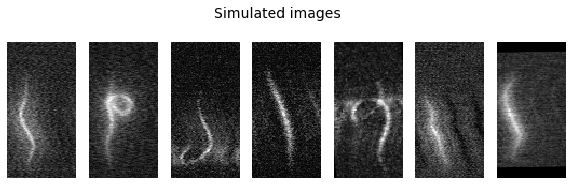

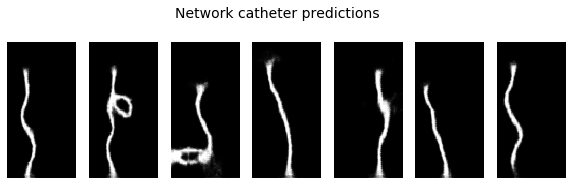

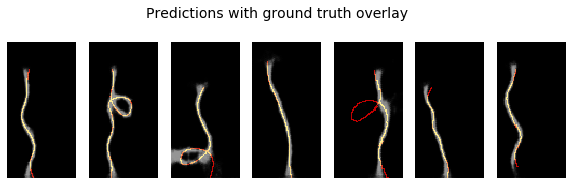

0m 27s
Epoch 53/99
----------
LR 0.005
Batch 0 : 0.021719107404351234
Batch 10 : 0.019401459023356438
Batch 20 : 0.020368309691548347
Batch 30 : 0.020862283185124397
Loss train : 0.02111772
Batch 0 : 0.022969240322709084
Loss val : 0.02194877


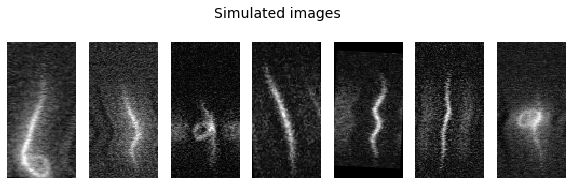

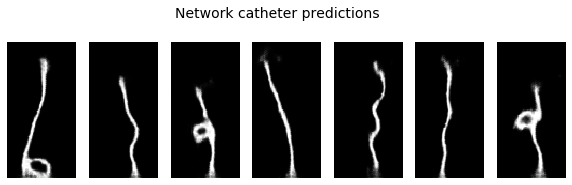

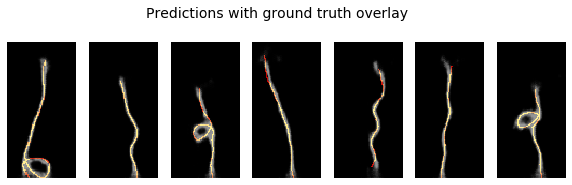

saving best model
0m 27s
Epoch 54/99
----------
LR 0.005
Batch 0 : 0.020301656797528267
Batch 10 : 0.0211175624281168
Batch 20 : 0.021098589524626732
Batch 30 : 0.021440286189317703
Loss train : 0.02099430
Batch 0 : 0.021166862919926643
Loss val : 0.02227020


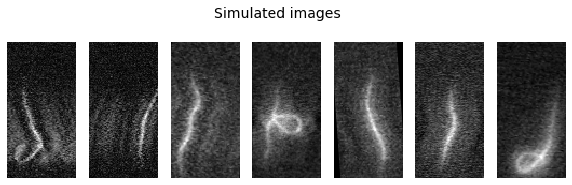

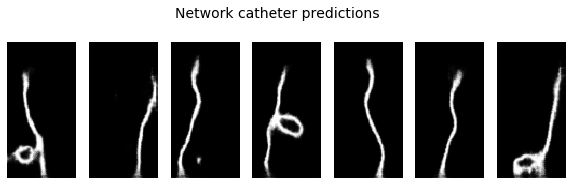

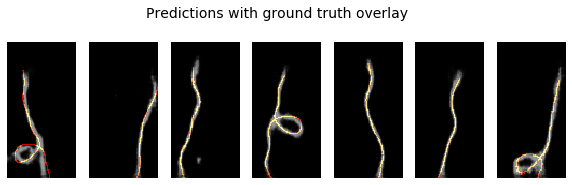

0m 29s
Epoch 55/99
----------
LR 0.005
Batch 0 : 0.020057369023561478
Batch 10 : 0.021427609026432037
Batch 20 : 0.022090978920459747
Batch 30 : 0.021357009187340736
Loss train : 0.02081416
Batch 0 : 0.022444792091846466
Loss val : 0.02198024


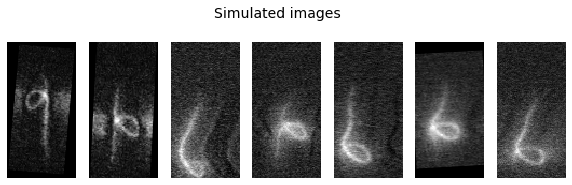

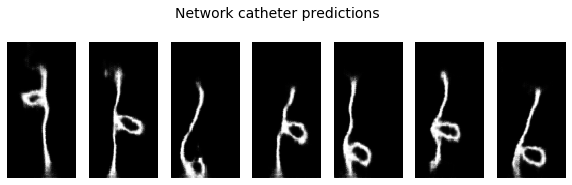

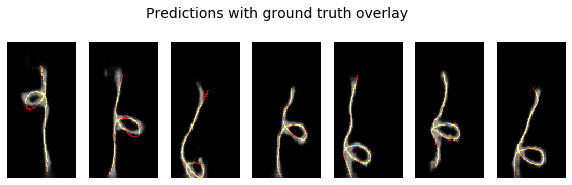

0m 31s
Epoch 56/99
----------
LR 0.005
Batch 0 : 0.02149748057126999
Batch 10 : 0.02048868127167225
Batch 20 : 0.020835554227232933
Batch 30 : 0.02108357660472393
Loss train : 0.02069850
Batch 0 : 0.022532276809215546
Loss val : 0.02254294


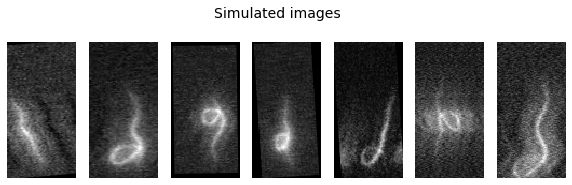

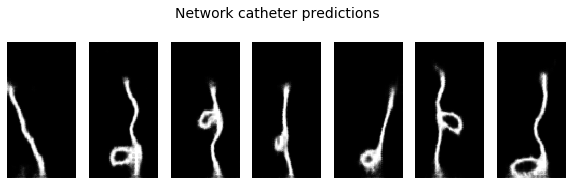

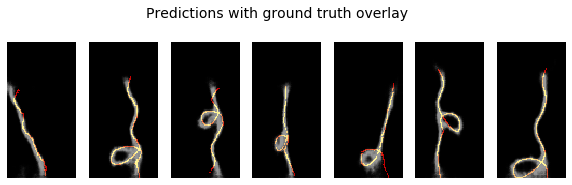

0m 29s
Epoch 57/99
----------
LR 0.005
Batch 0 : 0.020248832181096077
Batch 10 : 0.020653868094086647
Batch 20 : 0.021130699664354324
Batch 30 : 0.020847298204898834
Loss train : 0.02072043
Batch 0 : 0.02134593576192856
Loss val : 0.02196887


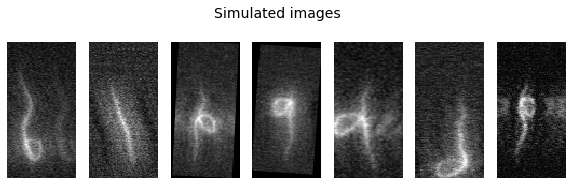

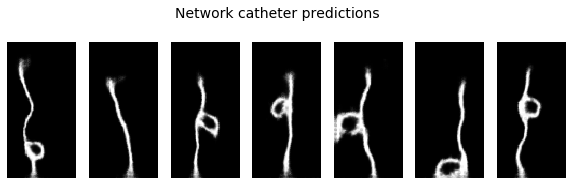

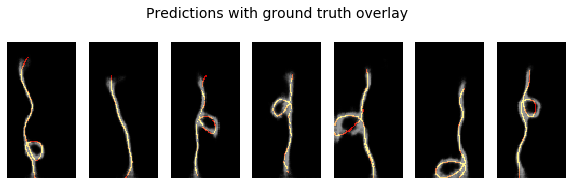

0m 28s
Epoch 58/99
----------
LR 0.005
Batch 0 : 0.020935116335749626
Batch 10 : 0.019986240193247795
Batch 20 : 0.020783407613635063
Batch 30 : 0.020814403891563416
Loss train : 0.02087497
Batch 0 : 0.022517414763569832
Loss val : 0.02245255


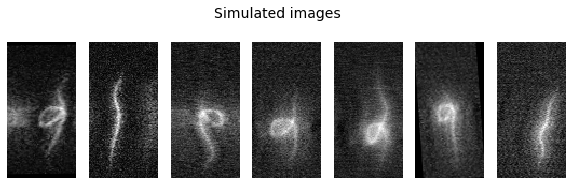

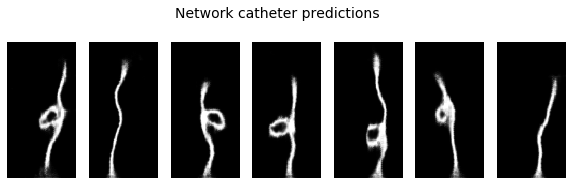

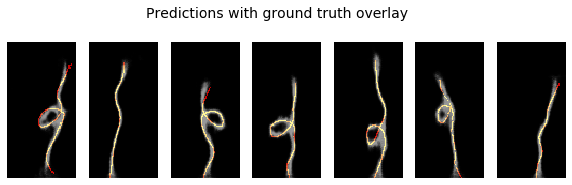

0m 28s
Epoch 59/99
----------
LR 0.005
Batch 0 : 0.020242100581526756
Batch 10 : 0.019923659041523933
Batch 20 : 0.020699279382824898
Batch 30 : 0.02109243907034397
Loss train : 0.02069615
Batch 0 : 0.022021019831299782
Loss val : 0.02216330


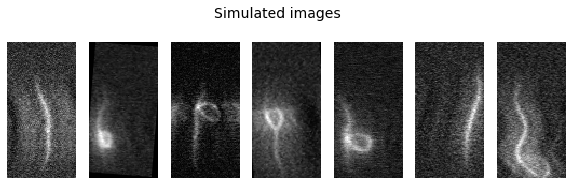

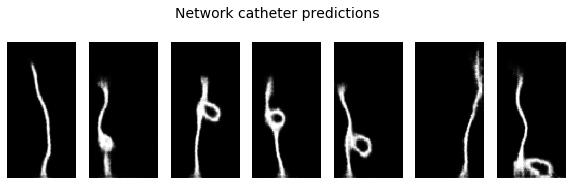

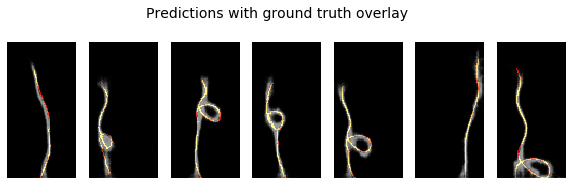

0m 31s
Epoch 60/99
----------
LR 0.005
Batch 0 : 0.020098863169550896
Batch 10 : 0.01933799311518669
Batch 20 : 0.019210319966077805
Batch 30 : 0.021632101386785507
Loss train : 0.02058085
Batch 0 : 0.020943325012922287
Loss val : 0.02168854


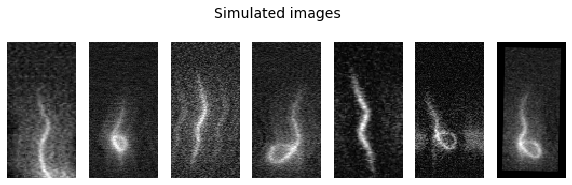

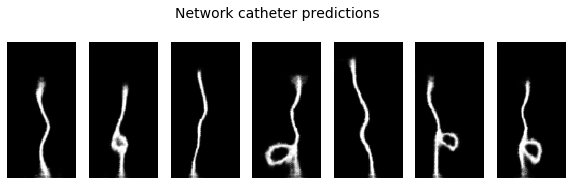

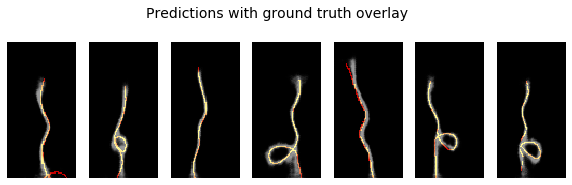

saving best model
0m 28s
Epoch 61/99
----------
LR 0.005
Batch 0 : 0.020641982555389404
Batch 10 : 0.02092384360730648
Batch 20 : 0.020959800109267235
Batch 30 : 0.020020833238959312
Loss train : 0.02061380
Batch 0 : 0.022559771314263344
Loss val : 0.02243231


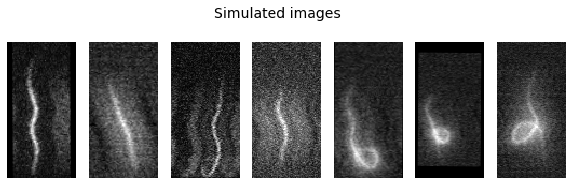

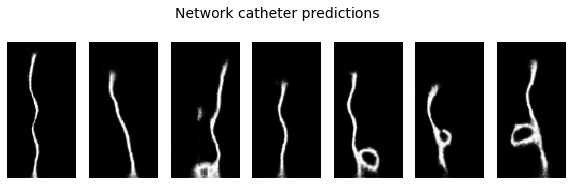

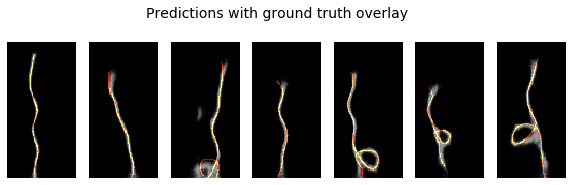

0m 28s
Epoch 62/99
----------
LR 0.005
Batch 0 : 0.02096184715628624
Batch 10 : 0.0208025723695755
Batch 20 : 0.020390238612890244
Batch 30 : 0.020412541925907135
Loss train : 0.02045435
Batch 0 : 0.02194000408053398
Loss val : 0.02162844


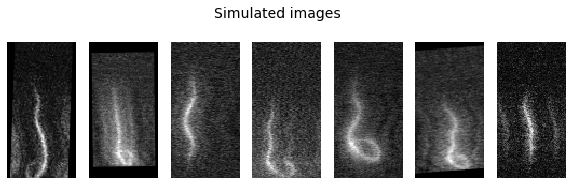

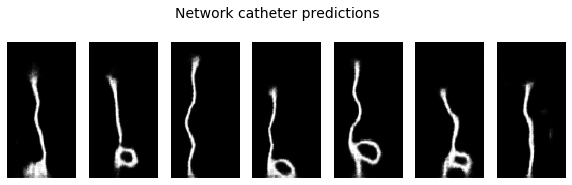

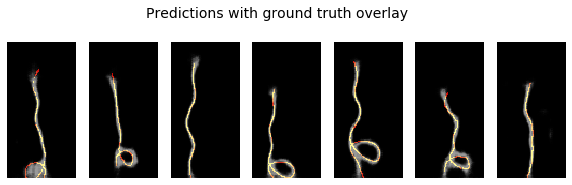

saving best model
0m 28s
Epoch 63/99
----------
LR 0.005
Batch 0 : 0.019619714468717575
Batch 10 : 0.01866171509027481
Batch 20 : 0.02016531489789486
Batch 30 : 0.02110053226351738
Loss train : 0.02035938
Batch 0 : 0.02132783830165863
Loss val : 0.02204412


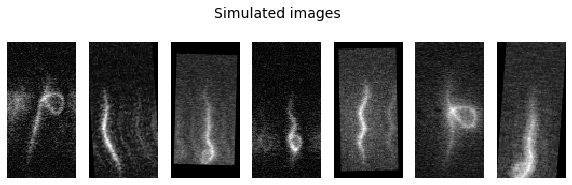

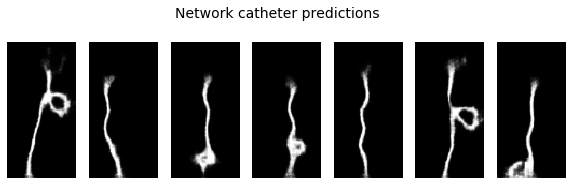

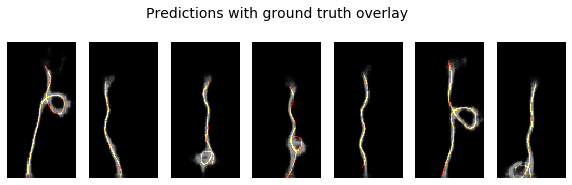

0m 31s
Epoch 64/99
----------
LR 0.005
Batch 0 : 0.020117657259106636
Batch 10 : 0.021337023004889488
Batch 20 : 0.021618077531456947
Batch 30 : 0.019834905862808228
Loss train : 0.02028691
Batch 0 : 0.02170729637145996
Loss val : 0.02174472


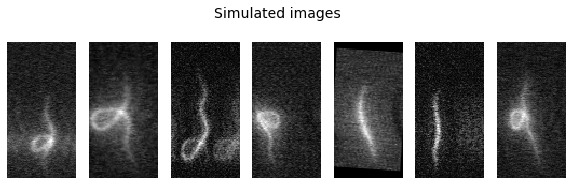

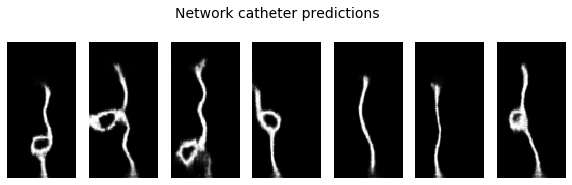

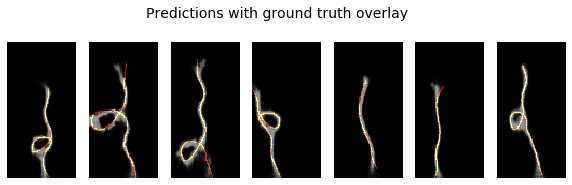

0m 29s
Epoch 65/99
----------
LR 0.005
Batch 0 : 0.02058461681008339
Batch 10 : 0.021581852808594704
Batch 20 : 0.020770573988556862
Batch 30 : 0.02039935067296028
Loss train : 0.02006082
Batch 0 : 0.020763983950018883
Loss val : 0.02168388


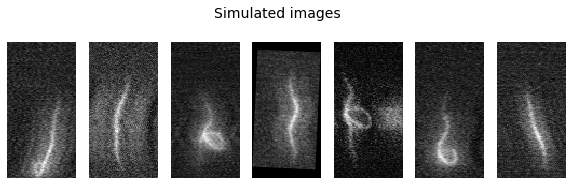

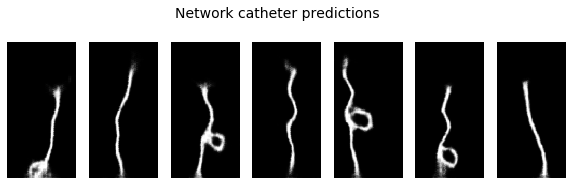

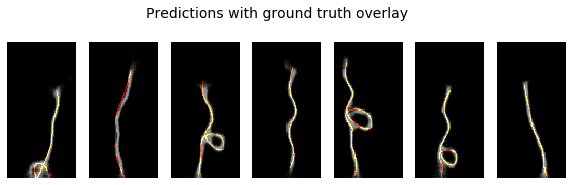

0m 28s
Epoch 66/99
----------
LR 0.005
Batch 0 : 0.018963361158967018
Batch 10 : 0.020676732063293457
Batch 20 : 0.021385230123996735
Batch 30 : 0.01982436329126358
Loss train : 0.02016455
Batch 0 : 0.021777436137199402
Loss val : 0.02186697


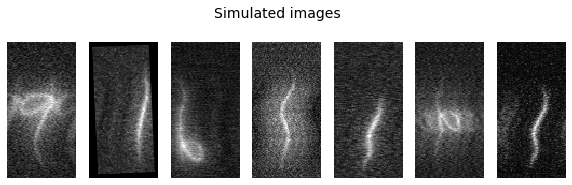

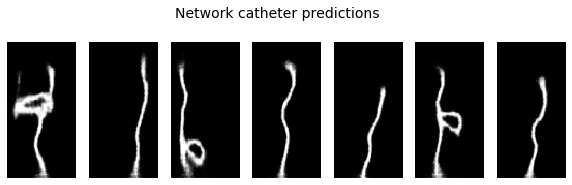

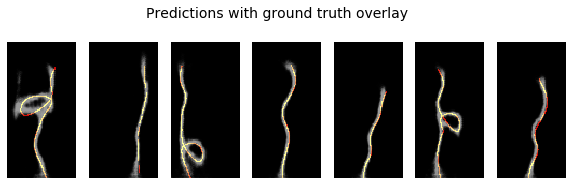

0m 27s
Epoch 67/99
----------
LR 0.005
Batch 0 : 0.01955256052315235
Batch 10 : 0.01996949501335621
Batch 20 : 0.021507132798433304
Batch 30 : 0.021596403792500496
Loss train : 0.02003844
Batch 0 : 0.021109161898493767
Loss val : 0.02165833


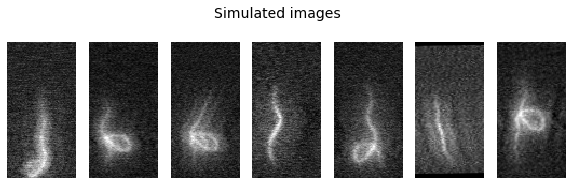

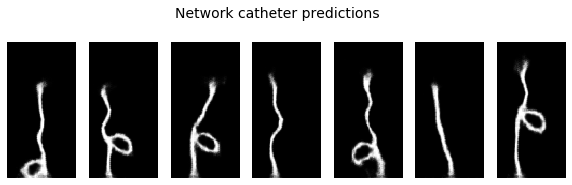

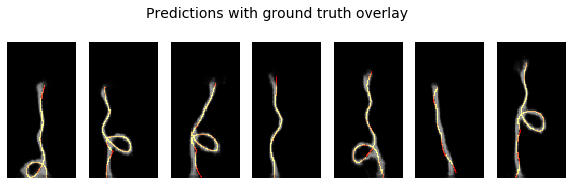

0m 28s
Epoch 68/99
----------
LR 0.005
Batch 0 : 0.020353445783257484
Batch 10 : 0.01966906152665615
Batch 20 : 0.019481943920254707
Batch 30 : 0.02146109566092491
Loss train : 0.01996623
Batch 0 : 0.02132258005440235
Loss val : 0.02159210


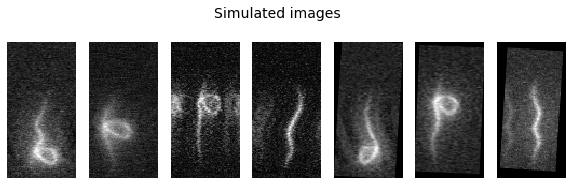

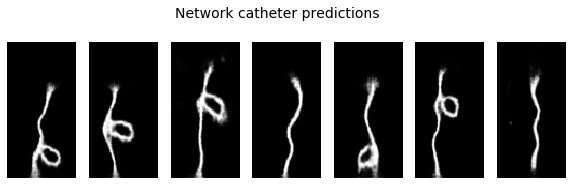

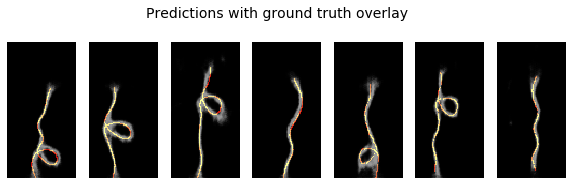

saving best model
0m 31s
Epoch 69/99
----------
LR 0.005
Batch 0 : 0.019177783280611038
Batch 10 : 0.01964217983186245
Batch 20 : 0.019802195951342583
Batch 30 : 0.0196115430444479
Loss train : 0.02000924
Batch 0 : 0.022662518545985222
Loss val : 0.02152985


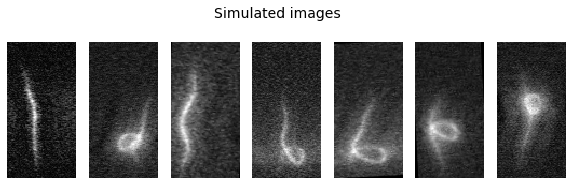

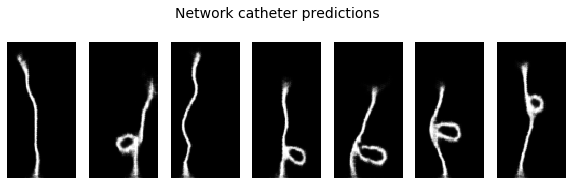

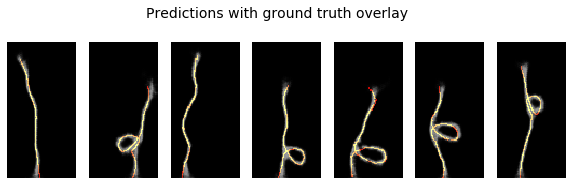

saving best model
0m 29s
Epoch 70/99
----------
LR 0.005
Batch 0 : 0.019468775019049644
Batch 10 : 0.02064046449959278
Batch 20 : 0.018863564357161522
Batch 30 : 0.020297005772590637
Loss train : 0.01995836
Batch 0 : 0.02255938947200775
Loss val : 0.02165323


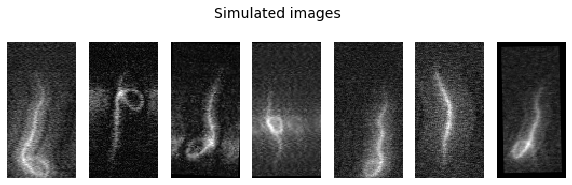

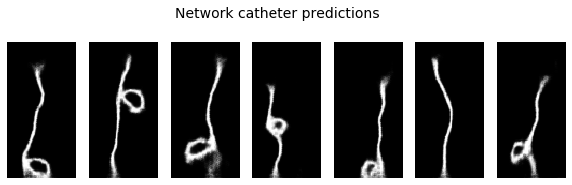

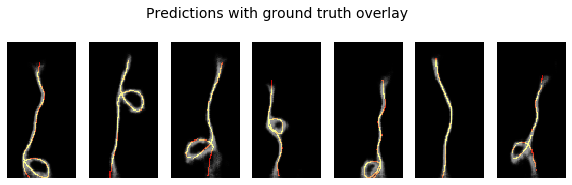

0m 28s
Epoch 71/99
----------
LR 0.005
Batch 0 : 0.020300209522247314
Batch 10 : 0.019683098420500755
Batch 20 : 0.020442571491003036
Batch 30 : 0.019472623243927956
Loss train : 0.02004150
Batch 0 : 0.021857839077711105
Loss val : 0.02151109


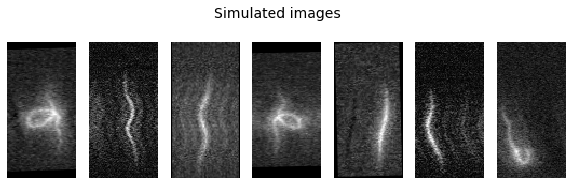

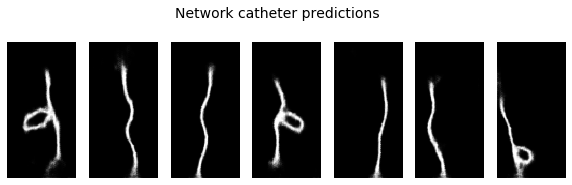

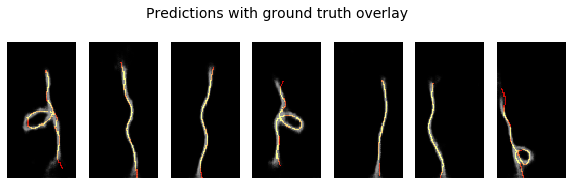

saving best model
0m 28s
Epoch 72/99
----------
LR 0.005
Batch 0 : 0.020451126620173454
Batch 10 : 0.02094648778438568
Batch 20 : 0.019173186272382736
Batch 30 : 0.019709374755620956
Loss train : 0.01988529
Batch 0 : 0.021395497024059296
Loss val : 0.02157558


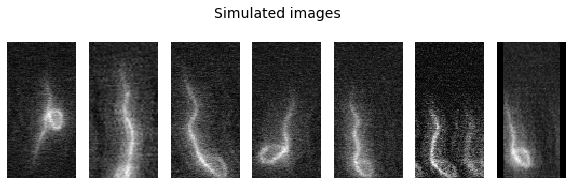

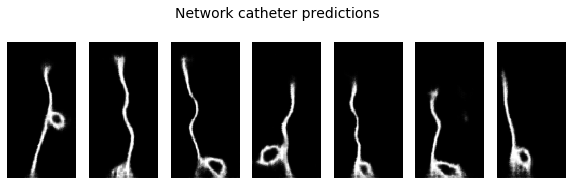

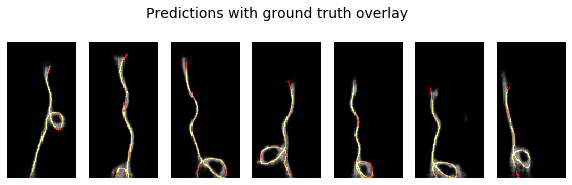

0m 31s
Epoch 73/99
----------
LR 0.005
Batch 0 : 0.020498137921094894
Batch 10 : 0.018997369334101677
Batch 20 : 0.018944567069411278
Batch 30 : 0.019069375470280647
Loss train : 0.01987728
Batch 0 : 0.020869912579655647
Loss val : 0.02197157


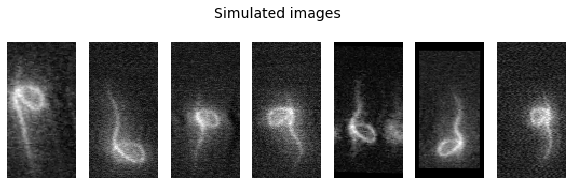

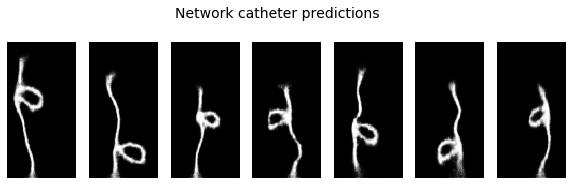

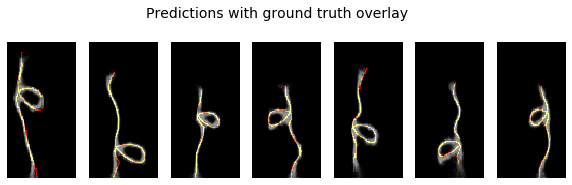

0m 27s
Epoch 74/99
----------
LR 0.005
Batch 0 : 0.01994284801185131
Batch 10 : 0.019122926518321037
Batch 20 : 0.020596422255039215
Batch 30 : 0.019964082166552544
Loss train : 0.02010714
Batch 0 : 0.02047843299806118
Loss val : 0.02148865


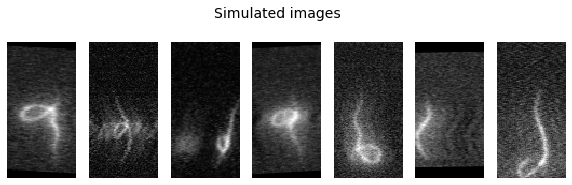

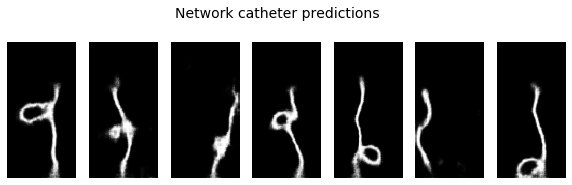

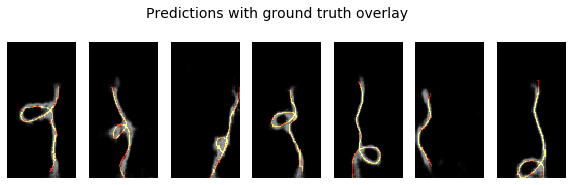

saving best model
0m 28s
Epoch 75/99
----------
LR 0.005
Batch 0 : 0.019634274765849113
Batch 10 : 0.01868550293147564
Batch 20 : 0.019315939396619797
Batch 30 : 0.019214188680052757
Loss train : 0.01973084
Batch 0 : 0.02133524976670742
Loss val : 0.02158936


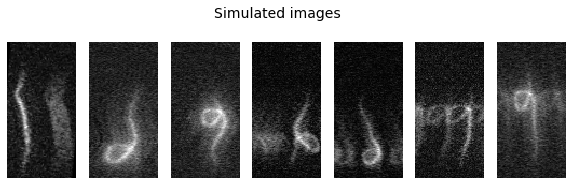

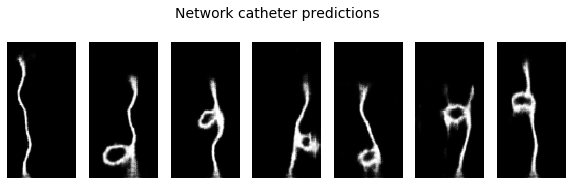

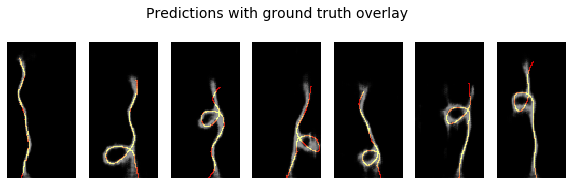

0m 28s
Epoch 76/99
----------
LR 0.005
Batch 0 : 0.018921485170722008
Batch 10 : 0.020098447799682617
Batch 20 : 0.020710179582238197
Batch 30 : 0.01973353698849678
Loss train : 0.01961485
Batch 0 : 0.01928989216685295
Loss val : 0.02132665


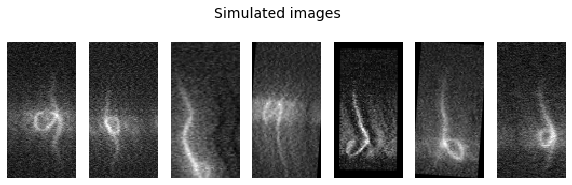

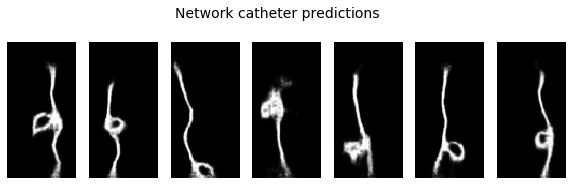

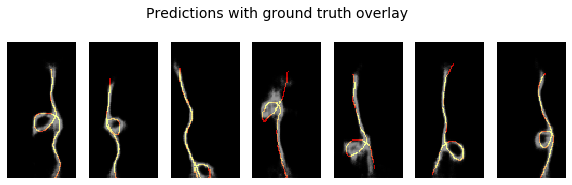

saving best model
0m 31s
Epoch 77/99
----------
LR 0.005
Batch 0 : 0.020848361775279045
Batch 10 : 0.019540729001164436
Batch 20 : 0.018107600510120392
Batch 30 : 0.02005205675959587
Loss train : 0.01942820
Batch 0 : 0.02146507054567337
Loss val : 0.02100997


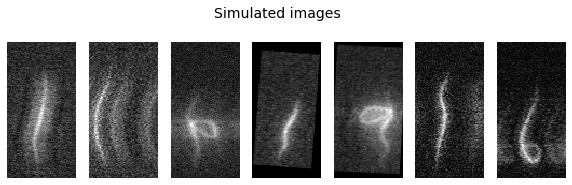

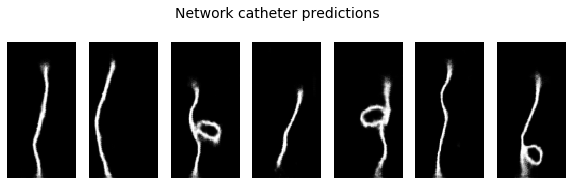

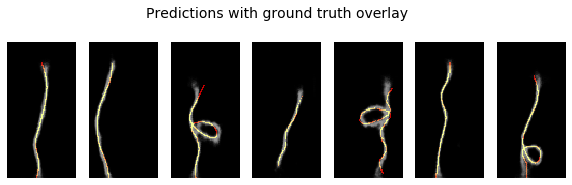

saving best model
0m 30s
Epoch 78/99
----------
LR 0.005
Batch 0 : 0.019035134464502335
Batch 10 : 0.01940852962434292
Batch 20 : 0.01970387063920498
Batch 30 : 0.0202995203435421
Loss train : 0.01969810
Batch 0 : 0.021925795823335648
Loss val : 0.02146630


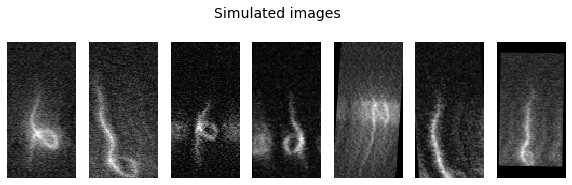

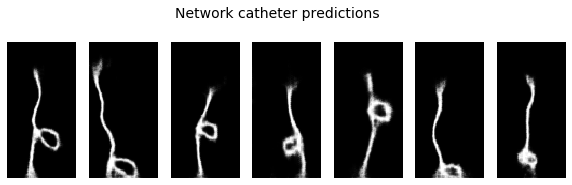

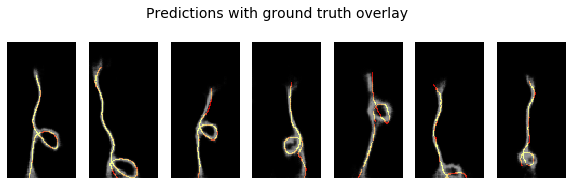

0m 27s
Epoch 79/99
----------
LR 0.005
Batch 0 : 0.020185362547636032
Batch 10 : 0.018802853301167488
Batch 20 : 0.020523276180028915
Batch 30 : 0.019995570182800293
Loss train : 0.01952755
Batch 0 : 0.02167661115527153
Loss val : 0.02174658


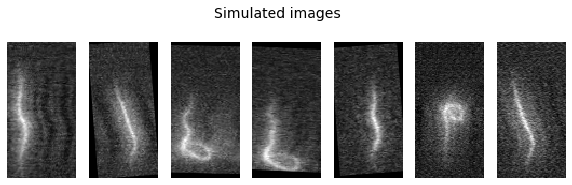

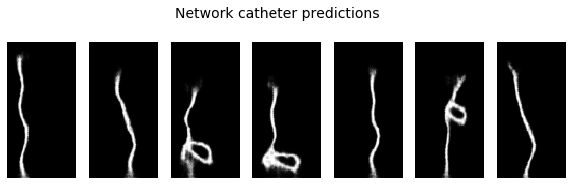

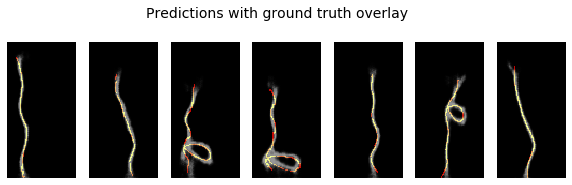

0m 29s
Epoch 80/99
----------
LR 0.005
Batch 0 : 0.02029419131577015
Batch 10 : 0.02030288614332676
Batch 20 : 0.019338980317115784
Batch 30 : 0.020513392984867096
Loss train : 0.01944152
Batch 0 : 0.020887937396764755
Loss val : 0.02098557


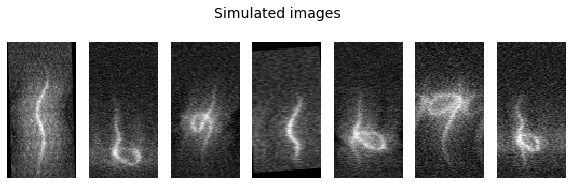

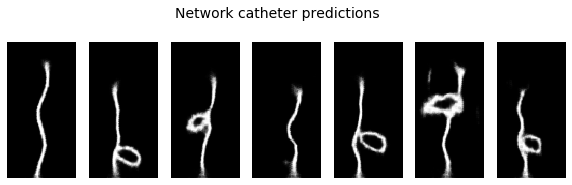

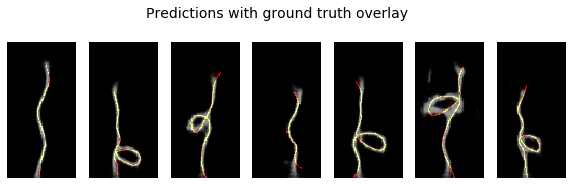

saving best model
0m 31s
Epoch 81/99
----------
LR 0.005
Batch 0 : 0.01859380677342415
Batch 10 : 0.020198659971356392
Batch 20 : 0.02063189446926117
Batch 30 : 0.018569115549325943
Loss train : 0.01940678
Batch 0 : 0.021103177219629288
Loss val : 0.02115029


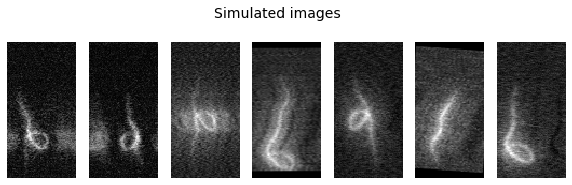

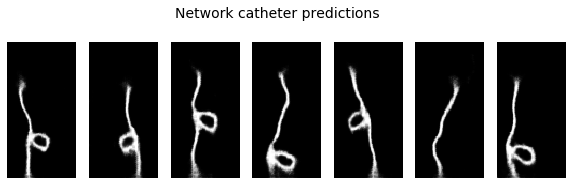

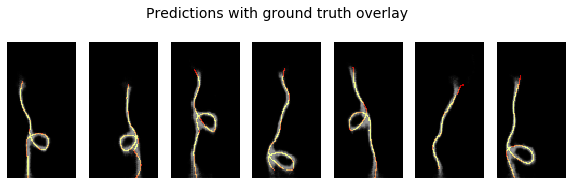

0m 30s
Epoch 82/99
----------
LR 0.005
Batch 0 : 0.018944134935736656
Batch 10 : 0.020141368731856346
Batch 20 : 0.020629798993468285
Batch 30 : 0.019467107951641083
Loss train : 0.01947525
Batch 0 : 0.022039858624339104
Loss val : 0.02122496


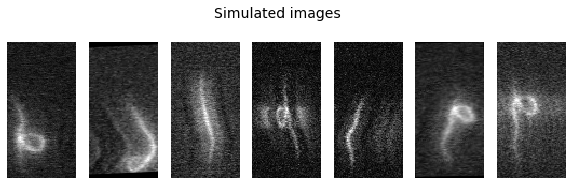

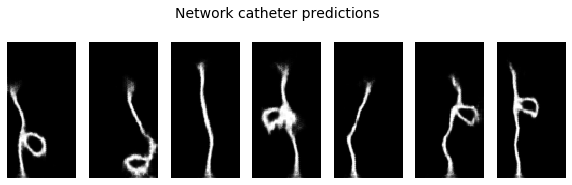

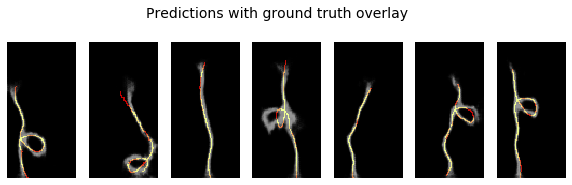

0m 27s
Epoch 83/99
----------
LR 0.005
Batch 0 : 0.019447708502411842
Batch 10 : 0.018685931339859962
Batch 20 : 0.018492836505174637
Batch 30 : 0.020465997979044914
Loss train : 0.01948730
Batch 0 : 0.021938633173704147
Loss val : 0.02142309


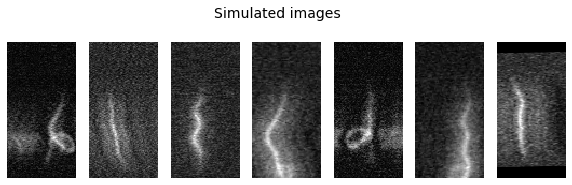

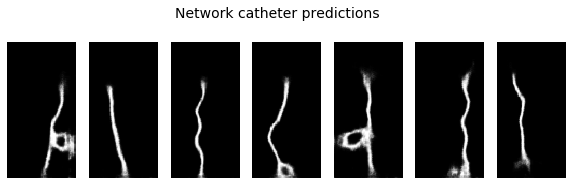

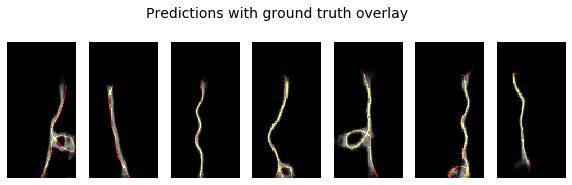

0m 28s
Epoch 84/99
----------
LR 0.005
Batch 0 : 0.018836697563529015
Batch 10 : 0.0182044617831707
Batch 20 : 0.019175542518496513
Batch 30 : 0.019427739083766937
Loss train : 0.01959882
Batch 0 : 0.021657384932041168
Loss val : 0.02109311


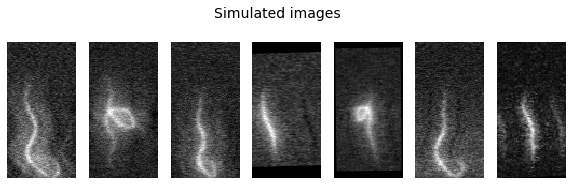

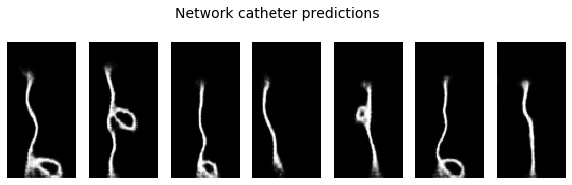

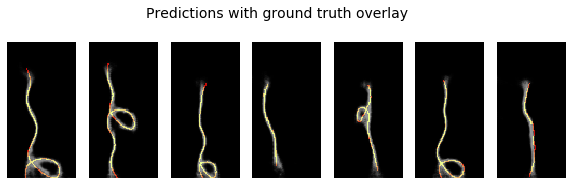

0m 30s
Epoch 85/99
----------
LR 0.005
Batch 0 : 0.019519777968525887
Batch 10 : 0.018517665565013885
Batch 20 : 0.01921730674803257
Batch 30 : 0.019250968471169472
Loss train : 0.01934277
Batch 0 : 0.02242116630077362
Loss val : 0.02129532


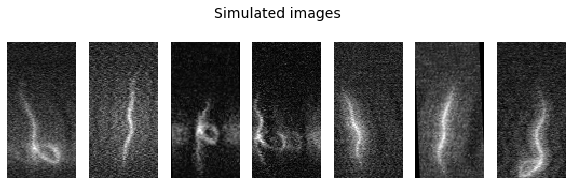

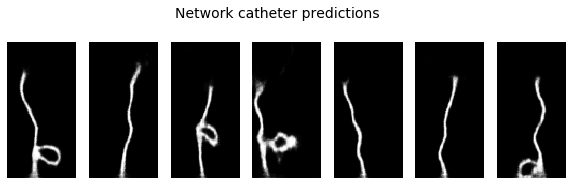

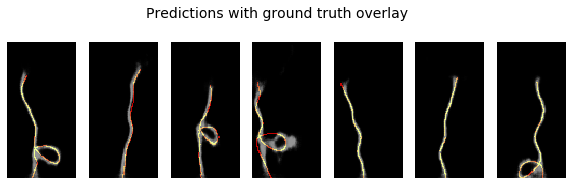

0m 29s
Epoch 86/99
----------
LR 0.005
Batch 0 : 0.018518123775720596
Batch 10 : 0.019265638664364815
Batch 20 : 0.019058672711253166
Batch 30 : 0.019647954031825066
Loss train : 0.01904278
Batch 0 : 0.021287579089403152
Loss val : 0.02119615


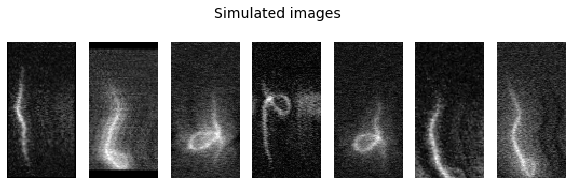

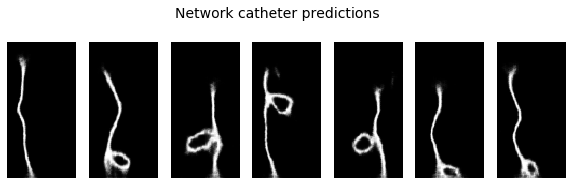

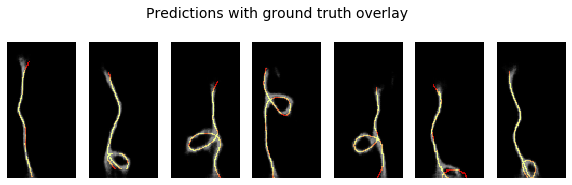

0m 28s
Epoch 87/99
----------
LR 0.005
Batch 0 : 0.018971633166074753
Batch 10 : 0.019034266471862793
Batch 20 : 0.0183707345277071
Batch 30 : 0.018860692158341408
Loss train : 0.01903271
Batch 0 : 0.018867557868361473
Loss val : 0.02064813


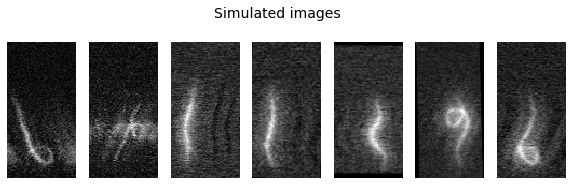

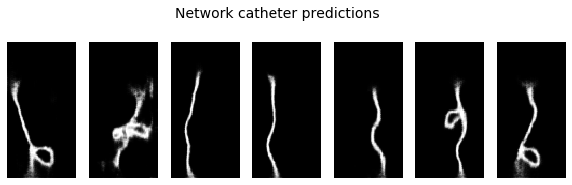

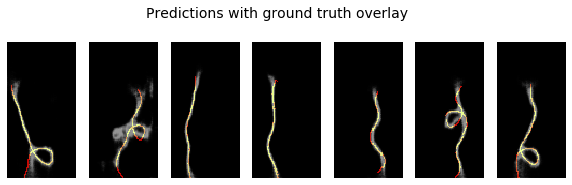

saving best model
0m 29s
Epoch 88/99
----------
LR 0.005
Batch 0 : 0.01833561807870865
Batch 10 : 0.01705433428287506
Batch 20 : 0.01972970925271511
Batch 30 : 0.019564948976039886
Loss train : 0.01909490
Batch 0 : 0.022069916129112244
Loss val : 0.02111686


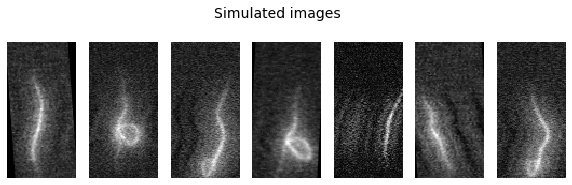

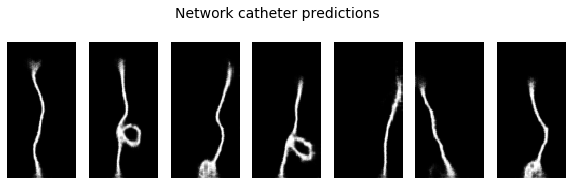

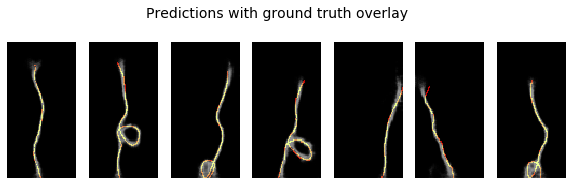

0m 30s
Epoch 89/99
----------
LR 0.005
Batch 0 : 0.01869993843138218
Batch 10 : 0.018941795453429222
Batch 20 : 0.018580663949251175
Batch 30 : 0.01851409114897251
Loss train : 0.01894451
Batch 0 : 0.02303672395646572
Loss val : 0.02159568


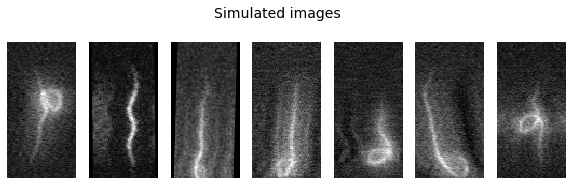

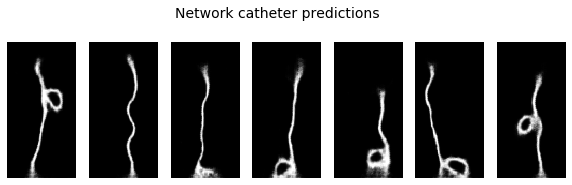

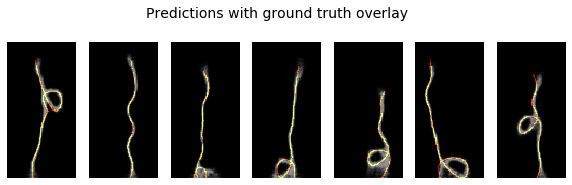

0m 31s
Epoch 90/99
----------
LR 0.005
Batch 0 : 0.0200654249638319
Batch 10 : 0.019155023619532585
Batch 20 : 0.017234433442354202
Batch 30 : 0.019314467906951904
Loss train : 0.01906905
Batch 0 : 0.020772628486156464
Loss val : 0.02104396


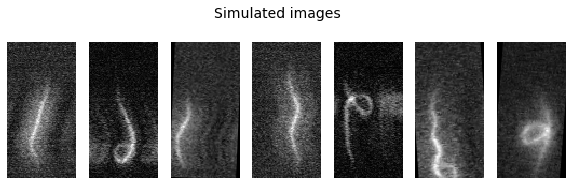

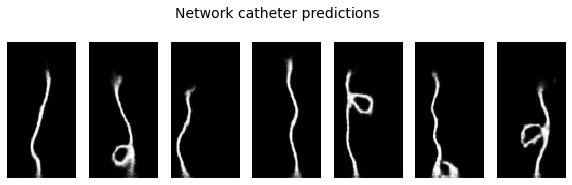

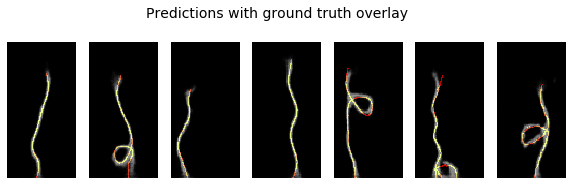

0m 28s
Epoch 91/99
----------
LR 0.005
Batch 0 : 0.01909511350095272
Batch 10 : 0.01928289234638214
Batch 20 : 0.018129313364624977
Batch 30 : 0.017429634928703308
Loss train : 0.01889148
Batch 0 : 0.020822543650865555
Loss val : 0.02135576


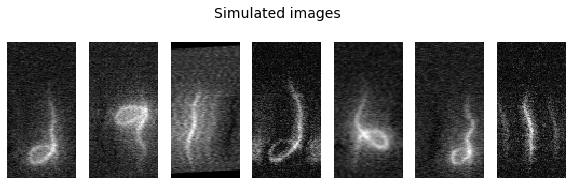

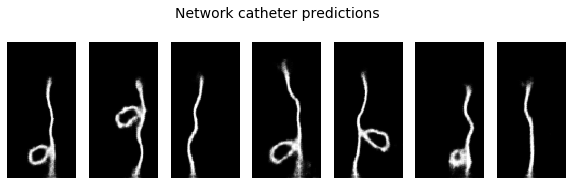

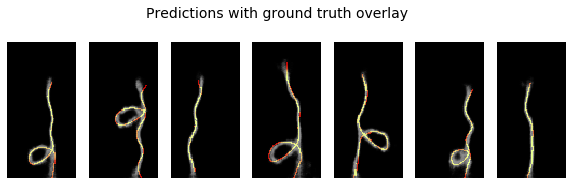

0m 27s
Epoch 92/99
----------
LR 0.005
Batch 0 : 0.019805751740932465
Batch 10 : 0.018970398232340813
Batch 20 : 0.018284862861037254
Batch 30 : 0.01912679895758629
Loss train : 0.01906535
Batch 0 : 0.021274246275424957
Loss val : 0.02094320


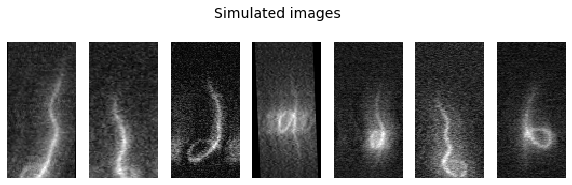

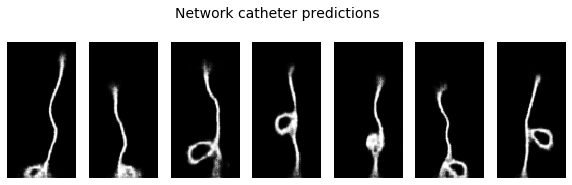

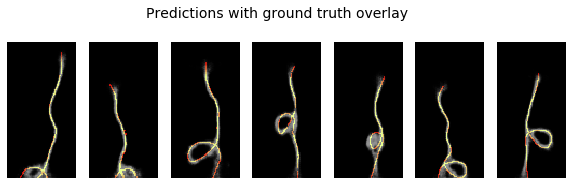

0m 29s
Epoch 93/99
----------
LR 0.005
Batch 0 : 0.019924135878682137
Batch 10 : 0.018844766542315483
Batch 20 : 0.019616231322288513
Batch 30 : 0.02047116495668888
Loss train : 0.01920535
Batch 0 : 0.021098561584949493
Loss val : 0.02093031


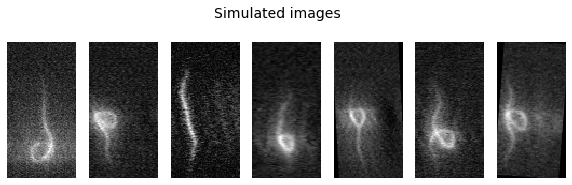

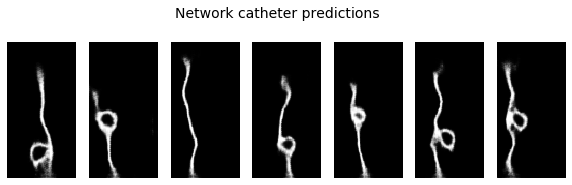

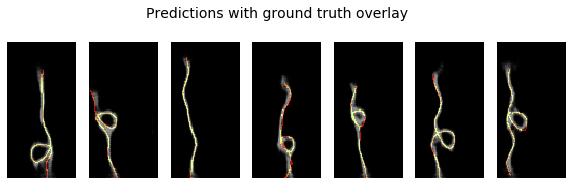

0m 30s
Epoch 94/99
----------
LR 0.005
Batch 0 : 0.01835971139371395
Batch 10 : 0.018084900453686714
Batch 20 : 0.019055388867855072
Batch 30 : 0.018448777496814728
Loss train : 0.01909418
Batch 0 : 0.02098902314901352
Loss val : 0.02099901


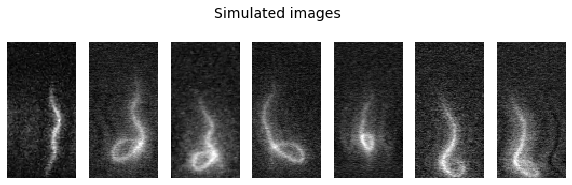

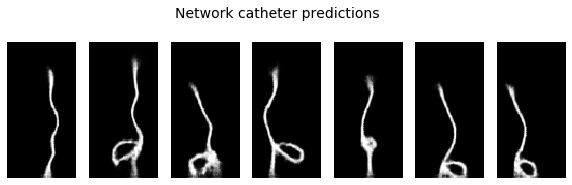

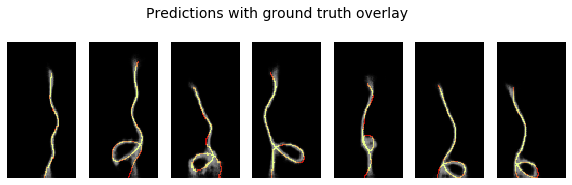

0m 28s
Epoch 95/99
----------
LR 0.005
Batch 0 : 0.01831192336976528
Batch 10 : 0.017316553741693497
Batch 20 : 0.017681369557976723
Batch 30 : 0.01958564668893814
Loss train : 0.01875335
Batch 0 : 0.021571217104792595
Loss val : 0.02141928


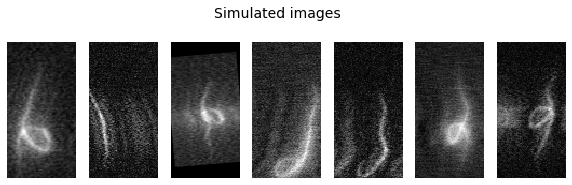

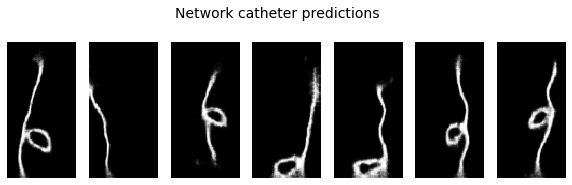

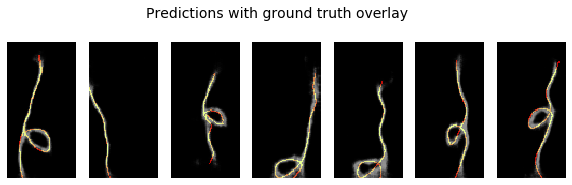

0m 29s
Epoch 96/99
----------
LR 0.005
Batch 0 : 0.019272899255156517
Batch 10 : 0.01856532320380211
Batch 20 : 0.018513167276978493
Batch 30 : 0.018877586349844933
Loss train : 0.01885159
Batch 0 : 0.021745510399341583
Loss val : 0.02130874


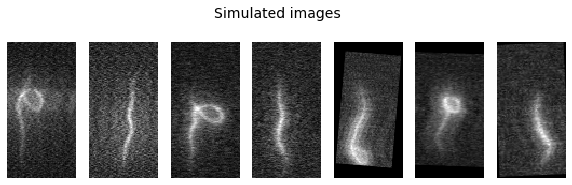

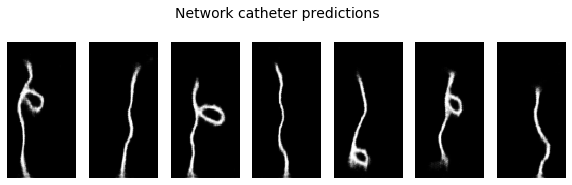

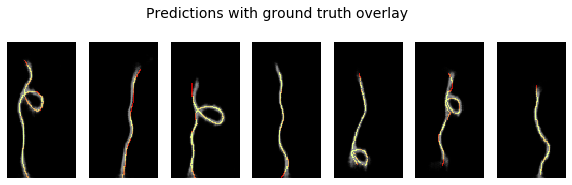

0m 28s
Epoch 97/99
----------
LR 0.005
Batch 0 : 0.018244987353682518
Batch 10 : 0.018321625888347626
Batch 20 : 0.019459731876850128
Batch 30 : 0.01954769343137741
Loss train : 0.01896476
Batch 0 : 0.01945360004901886
Loss val : 0.02098119


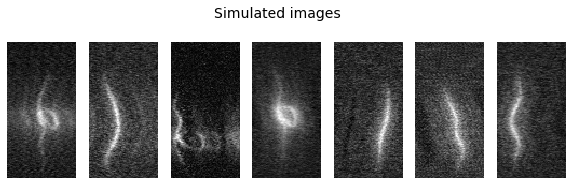

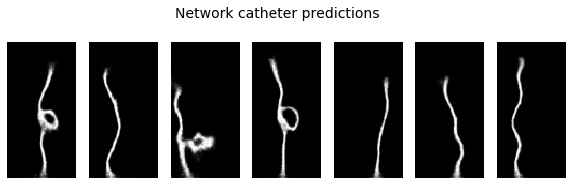

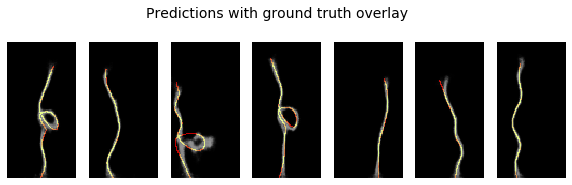

0m 32s
Epoch 98/99
----------
LR 0.005
Batch 0 : 0.018958235159516335
Batch 10 : 0.01848563179373741
Batch 20 : 0.018893826752901077
Batch 30 : 0.017664987593889236
Loss train : 0.01859595
Batch 0 : 0.021211370825767517
Loss val : 0.02089006


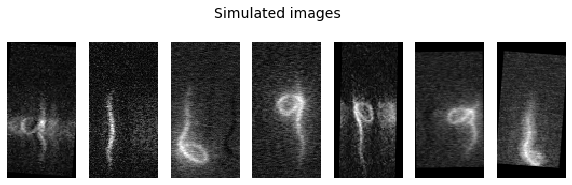

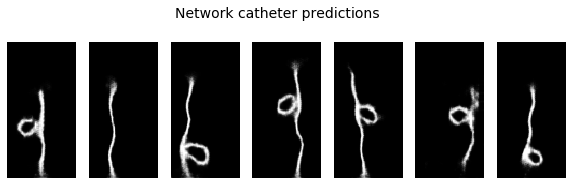

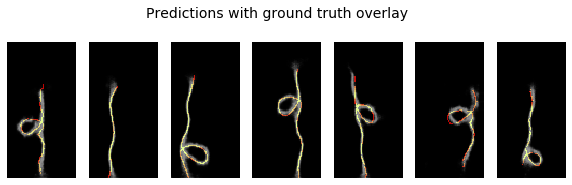

0m 27s
Epoch 99/99
----------
LR 0.005
Batch 0 : 0.018858052790164948
Batch 10 : 0.018330790102481842
Batch 20 : 0.019837651401758194
Batch 30 : 0.017781570553779602
Loss train : 0.01891404
Batch 0 : 0.02029946818947792
Loss val : 0.02082428


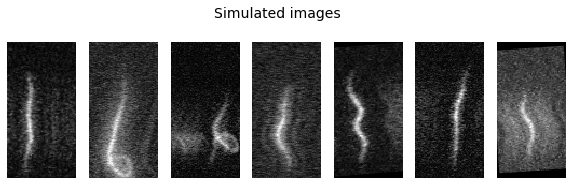

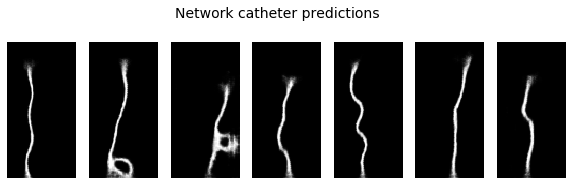

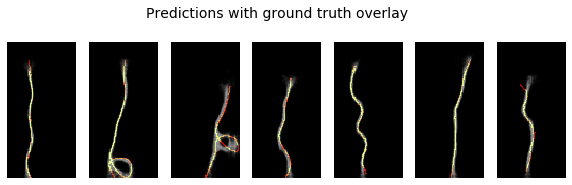

0m 33s
Best val loss: 0.020648


In [8]:
from collections import defaultdict
import torch.optim as optim
from torch.optim import lr_scheduler

import time
import copy

def train_model(model, optimizer, scheduler = None, num_epochs=25, train_stats_period=10):
    best_loss = 1e10

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)
        
        since = time.time()

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step() if scheduler is not None else None
                for param_group in optimizer.param_groups:
                    print("LR", param_group['lr'])
                    
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            epoch_samples = 0
            loss_vec = []

            for batch_id, (inputs, labels) in enumerate(dataloaders[phase]):
                [inputs,labels] = apply_augmentation(inputs,labels)
                inputs = inputs.to(device)
                labels = labels.to(device)   


                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs.float())

                    loss = loss_function(torch.squeeze(outputs), labels.type(torch.float32))

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
#                         print (loss.item())
                    loss_vec.append(loss.item())  

                    if batch_id % train_stats_period == 0:
                        print('Batch', batch_id, ':', loss.item())

                # statistics
                epoch_samples += inputs.size(0)

            # print loss at every epoch 
            epoch_loss = np.mean(np.asarray(loss_vec), dtype=np.float32)
            #epoch_loss = np.mean(np.asarray(loss_vec), dtype=np.float32)/float(epoch_samples)
            print('Loss ' + phase, ': {:.8f}'.format(epoch_loss))
            writer.add_scalar('Loss ' + phase, epoch_loss, epoch)

            if phase == 'val':
                visualise(inputs.squeeze(1).cpu().numpy(), 'Simulated images')
                preds = outputs.squeeze(1).cpu().numpy()

                visualise(preds, 'Network catheter predictions')
                colour_outputs = outputs.repeat(1, 3, 1, 1).permute(0, 2, 3, 1).cpu().numpy()
                colour_outputs = norm(colour_outputs)
                red_labels = np.zeros(colour_outputs.shape)
                red_labels[:,:,:,0] = labels.cpu() * torch.from_numpy(1.3 - preds)
                red_labels[:,:,:,1] = labels.cpu() * torch.from_numpy(preds)
                overlay = colour_outputs + red_labels
                overlay = norm(overlay)
                visualise(overlay, 'Predictions with ground truth overlay')
                
            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                print("saving best model")
                best_loss = epoch_loss
                torch.save(model.state_dict(), save_path)

        time_elapsed = time.time() - since
        print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val loss: {:4f}'.format(best_loss))

model = Segnet.SegNet(num_class).float()
model = model.to(device)

optimizer_ft = optim.SGD(model.parameters(), lr = 0.001, momentum=0.9) 
optimizer_ft=torch.optim.Adam(model.parameters(),0.005)

# exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=25, gamma=0.1)

train_model(model, optimizer_ft, num_epochs=100)

## Evaluate on <u>real</u> data

In [ ]:
print(f'Loading {save_path}')
model.load_state_dict(torch.load(save_path))
model = model.to(device)
model.eval()

def infer(model, im):
    im = torch.Tensor(im).unsqueeze(0).unsqueeze(0).to(device)
    return model(im).squeeze(0).squeeze(0).cpu().detach().numpy()

print('Performance on real data')
import imageio
from PIL import Image
gif = imageio.get_reader('../data/cropped_gif.gif')
test_im = np.array(list(gif))[100]
test_im = np.array(Image.fromarray(test_im).resize([64, 128]))
test_im = norm(test_im)
# test_im = norm(np.array(Image.fromarray(test_im).resize([64, 128])))
plt.subplot(121)
show(test_im)
plt.title('Real acquisition')

# test_im = torch.Tensor(ims[0].float()).unsqueeze(0).to(device)
test_pred = infer(model, test_im)
plt.subplot(122)
show(test_pred)
plt.title('Predicted catheter \nsegmentation')
plt.show()

### Testing skeletonisation

In [ ]:
print('Skeletonisation')
from skimage.morphology import skeletonize
ims = first_batch[0]
gts = first_batch[1].float()
output_folder = 'output'
print(ims.shape)

import imageio

for i in range(5):
    test_im = np.squeeze(ims[i]).float()

    plt.subplot(141)
    show(test_im)
    plt.title('Simulated\n image')

    plt.subplot(144)
    show(np.squeeze(gts[i]))
    plt.title('Ground truth')

    sim_pred = infer(model, test_im)
    plt.subplot(142)
    show(sim_pred > 0.5)
    plt.title('Predicted\n segmentation')

    skeleton = 255 * skeletonize(sim_pred > 0.5)
    plt.subplot(143)
    show(skeleton)
    plt.title('Skeletonised')
    imageio.imwrite(os.path.join(output_folder, f'skeletonised_{i}.png'), skeleton.astype(np.uint8))
    
    plt.show()